# **Settings and paths**

In [1]:
# @title Settings

# To login in Google Drive
LOGIN_GDRIVE = False

# To setup Kaggle API
# In order to send predictions directly from Google Colab
KAGGLE_SETUP = True

# Kaggle competition name
COMPETITION_NAME = 'an2dl2526c2v2'

# To download clean dataset to Colab SSD (faster access)
DOWNLOAD_EVERY_DATASET_SSD = True

# To download raw dataset from Kaggle to disk (slow access)
DOWNLOAD_DATASET = False

# To run data cleaning and create a new folder with clean data
CLEAN_DATA = False

# To remove background from images and create a new folder with bno background data
REMOVE_BACKGROUND = False

# To create patches from images without background and save them in a new folder
CREATE_PATCHES = False
PATCH_SIZE = 256
PATCH_STRIDE = 256

# To compute the mean and standard deviation of the dataset
COMPUTE_MEAN_STD_DATASET = False

APPLY_MASK = False

# Seed for pseudo-random generation
# to ensure reproducibility
SEED = 42

# To plot data exploration visualizations
DO_PLOT = True

In [2]:
# @title Dataset information

# Base paths
DRIVE_DIR = "/gdrive/My\\ Drive/AN2DL_challenge/Challenge_2"
DATASET_DIR = 'dataset'

# Raw dataset dirs
TRAIN_DIR = DATASET_DIR + '/' + 'train_data'
TRAIN_LABELS_FILE = DATASET_DIR + '/' + 'train_labels.csv'
TEST_DIR = DATASET_DIR + '/' + 'test_data'

# Clean dataset dirs
CLEAN_TRAIN_DIR = DATASET_DIR + '/' + 'clean_train_data'

# No background dataset dirs
NOBG_TRAIN_DIR = DATASET_DIR + '/' + 'nobg_train_data'
NOBG_TEST_DIR = DATASET_DIR + '/' + 'nobg_test_data'
NOBG_TRAIN_PATCH_DIR = DATASET_DIR + '/' + 'nobg_patch_train_data'
NOBG_TEST_PATCH_DIR = DATASET_DIR + '/' + 'nobg_patch_test_data'

# Number of images in trainset (masks excluded)
N_TRAIN_IMAGES = 690

# Number of images in testset (masks excluded)
N_TEST_IMAGES = 476

In [3]:
# @title Helper function to submit to Kaggle

# Defines a function to submit the generated prediction file to Kaggle after user confirmation.
def submit_to_kaggle(submission_prefix):
  ans = input(f'Are you sure you want to submit {submission_prefix}.csv to Kaggle? (y/n)')
  if ans == 'y' or ans == 'Y':
    ! kaggle competitions submit -c {COMPETITION_NAME} -f {submission_prefix}.csv -m ""
  else:
    print('Submission cancelled.')

# **Import of libraries and basic setup**

In [4]:
# @title Kaggle connection

if KAGGLE_SETUP:
  # Download and set up Kaggle API token for competition submission
  ! mkdir -p /root/.config/kaggle/
  ! wget 'https://drive.google.com/uc?export=download&id=1KdJdglyvNUc8PbT8YkF28Rm8oOQ-ABoy' -O kaggle.json
  ! cp kaggle.json /root/.config/kaggle/
  ! chmod 600 /root/.config/kaggle/kaggle.json

  import kaggle

  print('Kaggle connection established correctly!')

--2025-12-16 20:39:28--  https://drive.google.com/uc?export=download&id=1KdJdglyvNUc8PbT8YkF28Rm8oOQ-ABoy
Resolving drive.google.com (drive.google.com)... 74.125.200.113, 74.125.200.101, 74.125.200.102, ...
Connecting to drive.google.com (drive.google.com)|74.125.200.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1KdJdglyvNUc8PbT8YkF28Rm8oOQ-ABoy&export=download [following]
--2025-12-16 20:39:28--  https://drive.usercontent.google.com/download?id=1KdJdglyvNUc8PbT8YkF28Rm8oOQ-ABoy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.200.132, 2404:6800:4003:c00::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.200.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 74 [application/octet-stream]
Saving to: ‘kaggle.json’

kaggle.json         100%[===================>]      74  --.-KB/s    in 0s      

In [5]:
# @title Download every dataset to SSD

if DOWNLOAD_EVERY_DATASET_SSD:
    ! gdown 1F1RpyIAw_Vmmn6jBr0c4HqVCWwYmxssN
    ! unzip -q cleaned_dataset.zip
    ! rm cleaned_dataset.zip

    BASE_SSD = '/content/'
    DATASET_DIR = BASE_SSD + 'cleaned_dataset'

    # Raw dataset dirs
    TRAIN_DIR = DATASET_DIR + '/' + 'train_data'
    TRAIN_LABELS_FILE = DATASET_DIR + '/' + 'train_labels.csv'
    TEST_DIR = DATASET_DIR + '/' + 'test_data'

    # Clean dataset dirs
    CLEAN_TRAIN_DIR = DATASET_DIR + '/' + 'clean_train_data'

    # No background dataset dirs
    NOBG_TRAIN_DIR = DATASET_DIR + '/' + 'nobg_train_data'
    NOBG_TEST_DIR = DATASET_DIR + '/' + 'nobg_test_data'
    NOBG_TRAIN_PATCH_DIR = DATASET_DIR + '/' + 'nobg_patch_train_data'
    NOBG_TEST_PATCH_DIR = DATASET_DIR + '/' + 'nobg_patch_test_data'


Downloading...
From (original): https://drive.google.com/uc?id=1F1RpyIAw_Vmmn6jBr0c4HqVCWwYmxssN
From (redirected): https://drive.google.com/uc?id=1F1RpyIAw_Vmmn6jBr0c4HqVCWwYmxssN&confirm=t&uuid=ae096cff-4961-4be4-a8f5-bec43e841af6
To: /content/cleaned_dataset.zip
100% 2.51G/2.51G [00:48<00:00, 51.4MB/s]


In [6]:
# @title Mount Google Drive

# Mount Google Drive filesystem
if LOGIN_GDRIVE:
  from google.colab import drive

  drive.mount("/gdrive")
  current_dir = DRIVE_DIR

  %cd $current_dir

In [7]:
# @title Import libraries

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(SEED)
random.seed(SEED)

# Import PyTorch
import torch
torch.manual_seed(SEED)
from torch import nn
from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision.transforms import v2 as transforms
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F
!pip install torchview
from torchview import draw_graph

# Configurazione di TensorBoard e directory
logs_dir = "tensorboard"
!pkill -f tensorboard
%load_ext tensorboard
!mkdir -p models

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

# Import other libraries
import cv2
import copy
import shutil
from itertools import product
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from PIL import Image
import matplotlib.gridspec as gridspec
import requests
from io import BytesIO
import re
import pickle as pkl
%pip install joypy
import joypy
from collections import defaultdict
from pathlib import Path
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

PyTorch version: 2.9.0+cu126
Device: cuda


In [8]:
# @title Download raw dataset

if DOWNLOAD_DATASET:
    %cd $current_dir

    # Download dataset
    print("Downloading dataset...")
    ! kaggle competitions download -c {COMPETITION_NAME}
    print("Dataset downloaded!")

    # Unzip dataset
    print("Unzipping dataset...")
    ! unzip -q {COMPETITION_NAME}.zip
    print("Dataset unzipped!")

    # Delete zip
    ! rm $current_dir\{COMPETITION_NAME}.zip

    # Move dataset in 'dataset' folder
    print(f'Moving dataset in \'{DATASET_DIR}\' folder')
    ! mkdir dataset
    ! mv train_labels.csv {TRAIN_LABELS_FILE}
    ! mv train_data {TRAIN_DIR}
    ! mv test_data {TEST_DIR}
    print('Dataset moved!')

In [9]:
# @title Dataset loader helper function

def load_images(folder, file_idxs, load_mask=True, normalize=True):
    """
    Load images having a given indeces from a specified folder.

    Args:
        folder (str): Path to the folder containing images
        file_idxs (list): List of image to load, either int or full file name

    Returns:
        list: Array of preprocessed images with shape
    """

    images = []
    masks = []

    for idx in file_idxs:
        # Check whether the file indices are given as names or numbers
        if type(idx) is str:
            img_filename = idx
            mask_filename = idx.replace("img", "mask")
        else:
            img_filename = 'img_{:0>4}.png'.format(idx)
            mask_filename = 'mask_{:0>4}.png'.format(idx)

        # Read image from disk
        img = cv2.imread(os.path.join(folder, img_filename))

        # Normalize image
        if normalize:
            img = (img / 255).astype(np.float32)

        # Convert image from BGR (cv2 default) to RGB
        img = img[...,::-1].copy() # Added .copy() here to resolve negative stride issue

        images.append(img)

        # If masks wanted
        if load_mask:
            # Read mask from disk
            mask = cv2.imread(os.path.join(folder, mask_filename))

            #Normalize mask
            mask = (mask / 255).astype(np.float32)

            masks.append(mask)

    if load_mask:
        return images, masks
    else:
        return images

# **Data exploration, cleaning, pre-processing, analysis**

## **Data exploration**

### **Target labels**

Observations:
 - There are four target classes to predict, each represents a type of breast cancer, we  the samples are images of biopsies of breast tissue.
 - Three of the four target classes are quite balanced (*Luminal A*, *Luminal B*, *HER2(+)*, each ~30% of the total), one is unbalanced (*Triple negative*, ~10%).

In [10]:
# @title Labels distribution

# Number of images in trainset
train_labels = pd.read_csv(TRAIN_LABELS_FILE)
images_count = train_labels.count().sample_index
print(f"Total training images (masks excluded): {images_count}\n")

# Written manually to enforce a better ordering
labels = ['Luminal A', 'Luminal B', 'HER2(+)', 'Triple negative']

# Number of samples for each target class
count_labels = { label: train_labels[train_labels.label == label].count().sample_index
                for label in labels }

print("Data distribution: ")
print('Label\t\t\tCount\tPercentage')
for label in labels:
    count = count_labels[label]
    perc_count = round(count/images_count,2)*100
    print(f'{label:<18}\t{count}\t{perc_count}%')

Total training images (masks excluded): 691

Data distribution: 
Label			Count	Percentage
Luminal A         	205	30.0%
Luminal B         	220	32.0%
HER2(+)           	189	27.0%
Triple negative   	77	11.0%


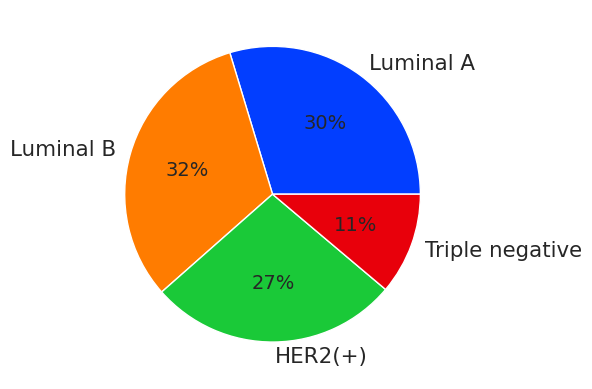

In [11]:
# @title Pie chart of labels distribution

if DO_PLOT:
    colors = sns.color_palette('bright')
    plt.pie(count_labels.values(), labels=labels, colors=colors, autopct='%.0f%%')
    plt.show()

### **Training images**

Observations:
 - The training dataset is composed of histological images and their bit masks. These masks, once applied to the corresponding images, are supposed to highlight the most important (discriminative) patches.
 - There are many patently spurious images (i.e. Shrek).
 - There are many images with impurities (i.e. green blobs).
 - Image sizes follow a peculiar pattern: almost always one of the two spatial dimensions is ~1024px, while the other one varies a lot, altough it is seems to be concentred around ~1024px as well. In fact, the medians (robust to outliers) of width and height are more or less 1024px.
 - Image aspect ratios are mostly concentrated around 1, nontheless they vary a lot. This may pose a problem of neural network data ingestion: we will choose to either resize them or patch them (divide them in tiles).

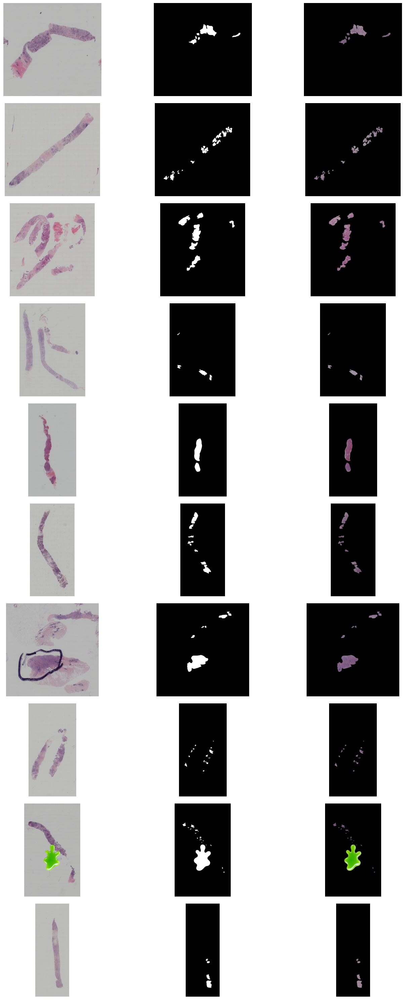

In [12]:
# @title Images overview

if DO_PLOT:
    # Number of images to display
    n_img = 10

    # Random image indices
    rand_idxs = np.random.choice(N_TRAIN_IMAGES+1, n_img)

    # Load dataset
    train_rand_imgs, train_rand_masks = load_images(TRAIN_DIR, rand_idxs)

    # Create subplots for displaying images
    fig, ax = plt.subplots(n_img, 3, figsize=(15, 30))

    for i in range(n_img):
        # Display images
        ax[i][0].imshow(train_rand_imgs[i])
        ax[i][0].axis('off')

        # Display masks
        ax[i][1].imshow(train_rand_masks[i])
        ax[i][1].axis('off')

        # Display images with applied masks
        ax[i][2].imshow(train_rand_imgs[i] * train_rand_masks[i])
        ax[i][2].axis('off')

    # Plot
    plt.tight_layout()
    plt.show()

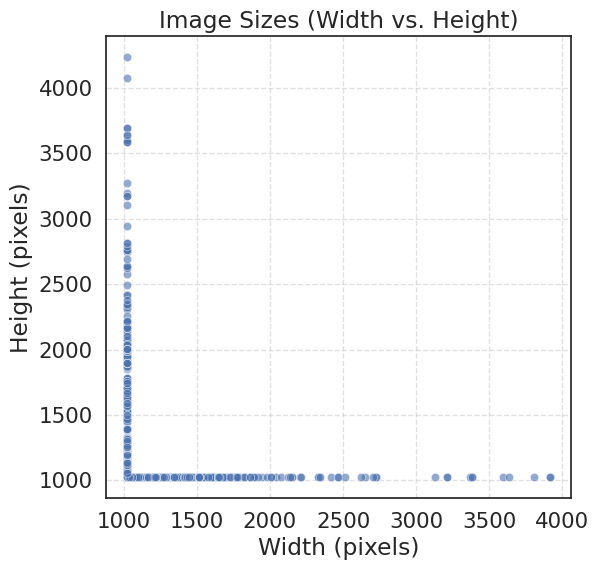

In [13]:
# @title Size of images

if DO_PLOT:
    image_sizes = { 'w': [], 'h': [] }

    # Loop through all training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False)[0]

        # Extract image spatial dimensions
        h, w, _ = img.shape

        image_sizes['w'].append(w)
        image_sizes['h'].append(h)

    # Convert to DataFrame
    image_sizes_df = pd.DataFrame(image_sizes)

    # Plot
    plt.figure(figsize=(6, 6))
    sns.scatterplot(data=image_sizes_df, x='w', y='h', alpha=0.6)
    plt.title('Image Sizes (Width vs. Height)')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    # Show main aggregated statistics of image sizes
    image_sizes_df.describe()

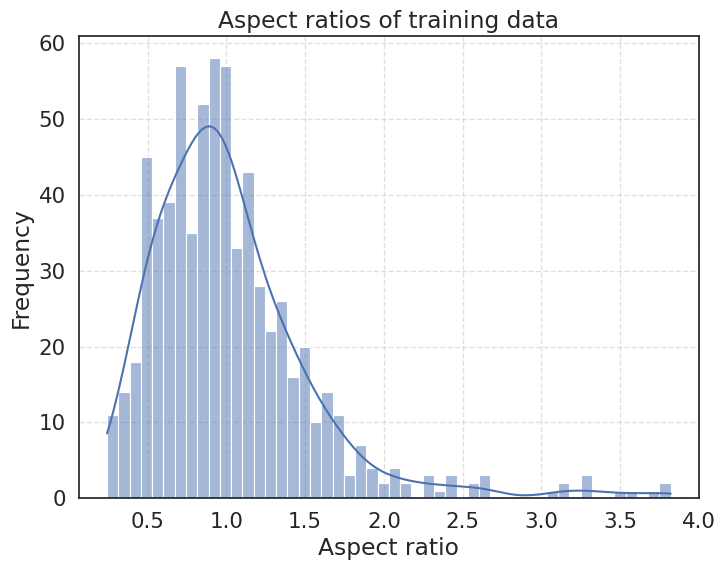

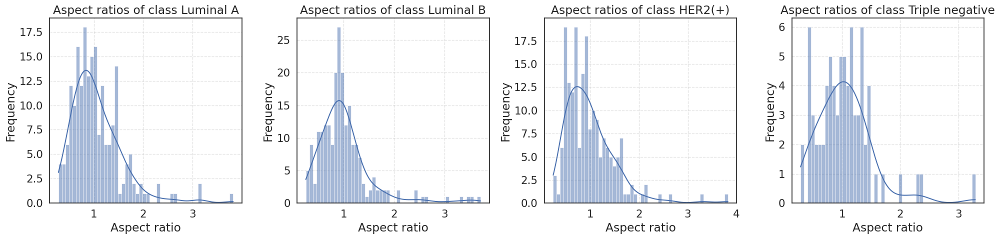

In [14]:
# @title Aspect ratios of images

if DO_PLOT:
    aspect_ratios = []
    aspect_ratio_label = { label: [] for label in labels }

    # Loop through training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False)[0]

        # Extract spatial dimentions
        h, w, _ = img.shape

        aspect_ratio = w / h

        # Get class label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        # Append aspect ratio by label
        aspect_ratio_label[label].append(aspect_ratio)

        # Append aspect ratio
        aspect_ratios.append(aspect_ratio)

    # Plot histogram of whole training dataset
    plt.figure(figsize=(8, 6))
    sns.histplot(aspect_ratios, bins=50, kde=True)
    plt.title('Aspect ratios of training data')
    plt.xlabel('Aspect ratio')
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    # Plot a histogram for each class label
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    for i, label in enumerate(labels):
        axes[i].set_title(f'Aspect ratios of class {label}')
        sns.histplot(aspect_ratio_label[label], bins=50, kde=True, ax=axes[i])
        axes[i].set_xlabel('Aspect ratio')
        axes[i].set_ylabel('Frequency')
        axes[i].grid(True, linestyle='--', alpha=0.6)
    fig.tight_layout()
    plt.show()

## **Data Cleaning**

### **Dirty images recognition and removal**


Observations:
 - We crafted a helper function able to recognize dirty images, after transforming them to HSV, based on the number of pixels that exceed certain thresholds.
 - There are 60 Shrek images and 50 slime images recognized as dirty. In fact, we confirm these numbers, since we have manually double-checked the dataset, looking for false-positives or false-negatives.
 - These dirty images will be simply discarded, since they are copies of other clean samples already present in the training set.

In [15]:
# @title Helper functions

def is_dirty(img):
    # Convert image to HSV, easier to recognize blobs
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # Number of pixels
    total_pixels = img.shape[0] * img.shape[1]

    # Set pixel thresholds to recognize blobs
    lower_slime = np.array([35, 150, 100])
    upper_slime = np.array([85, 255, 255])

    lower_shrek = np.array([15, 30, 20])
    upper_shrek = np.array([90, 255, 255])

    lower_ink = np.array([90, 50, 20])
    upper_ink = np.array([135, 255, 255])

    # Check if each img pixel is inside threshold ranges
    mask_slime = cv2.inRange(hsv_img, lower_slime, upper_slime)
    mask_shrek = cv2.inRange(hsv_img, lower_shrek, upper_shrek)
    mask_ink = cv2.inRange(hsv_img, lower_ink, upper_ink)

    # Count the number of pixels outside threshold ranges
    count_slime = cv2.countNonZero(mask_slime)
    count_shrek = cv2.countNonZero(mask_shrek)
    count_ink = cv2.countNonZero(mask_ink)

    # Actual Shrek pixels are shrek pixels not satisfying slime thresholds
    net_shrek_pixels = count_shrek - count_slime

    # If more than 0.2% are slime pixels, return slime
    if count_slime > (total_pixels * 0.002):
        return 2 # Slime

    # If more than 1.5% are Shrek pixels, return Shrek
    if net_shrek_pixels > (total_pixels * 0.015):
        return 1 # Shrek

    # Else
    return 0 # Normal image

In [16]:
# @title Recognition of Shrek images and slime images

shrek_list = []
slime_list = []

if CLEAN_DATA:
    print(f"Analyzing {N_TRAIN_IMAGES} images to find dirty ones...")

    # Loop through training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False, normalize=False)[0]

        # Check if image is dirty
        check_dirty = is_dirty(img)

        # If dirty
        if check_dirty == 1:
            shrek_list.append(i)
        elif check_dirty == 2:
            slime_list.append(i)

# Load pre-computed indices of Shrek and slime images
else:
    print('Importing serialized lists of Shrek images and slime images...')

    # If serialized lists are not already downloaded
    if not os.path.exists("shrek_list.pkl") or not os.path.exists("slime_list.pkl"):
        # Download serialized Shrek list
        ! gdown 1-49JVI8Q1lRfixgn2fD3tizuVzt-0OEL -O shrek_list.pkl

        # Download serialized slime list
        ! gdown 1XewAvU_ulZSZIAtxqBpC6NXg7fnev-eY -O slime_list.pkl

    # Load Shrek list in variable
    with open("shrek_list.pkl", "rb") as f:
        shrek_list = pkl.load(f)

    # Load slime list in variable
    with open("slime_list.pkl", "rb") as f:
        slime_list = pkl.load(f)

clean_list = [i for i in range(0, N_TRAIN_IMAGES+1) if i not in shrek_list and i not in slime_list]

print(f'\nNumber of Shrek images found: {len(shrek_list)}')
print(f'\nNumber of slime images found: {len(slime_list)}')

Importing serialized lists of Shrek images and slime images...
Downloading...
From: https://drive.google.com/uc?id=1-49JVI8Q1lRfixgn2fD3tizuVzt-0OEL
To: /content/shrek_list.pkl
100% 170/170 [00:00<00:00, 871kB/s]
Downloading...
From: https://drive.google.com/uc?id=1XewAvU_ulZSZIAtxqBpC6NXg7fnev-eY
To: /content/slime_list.pkl
100% 149/149 [00:00<00:00, 729kB/s]

Number of Shrek images found: 60

Number of slime images found: 50


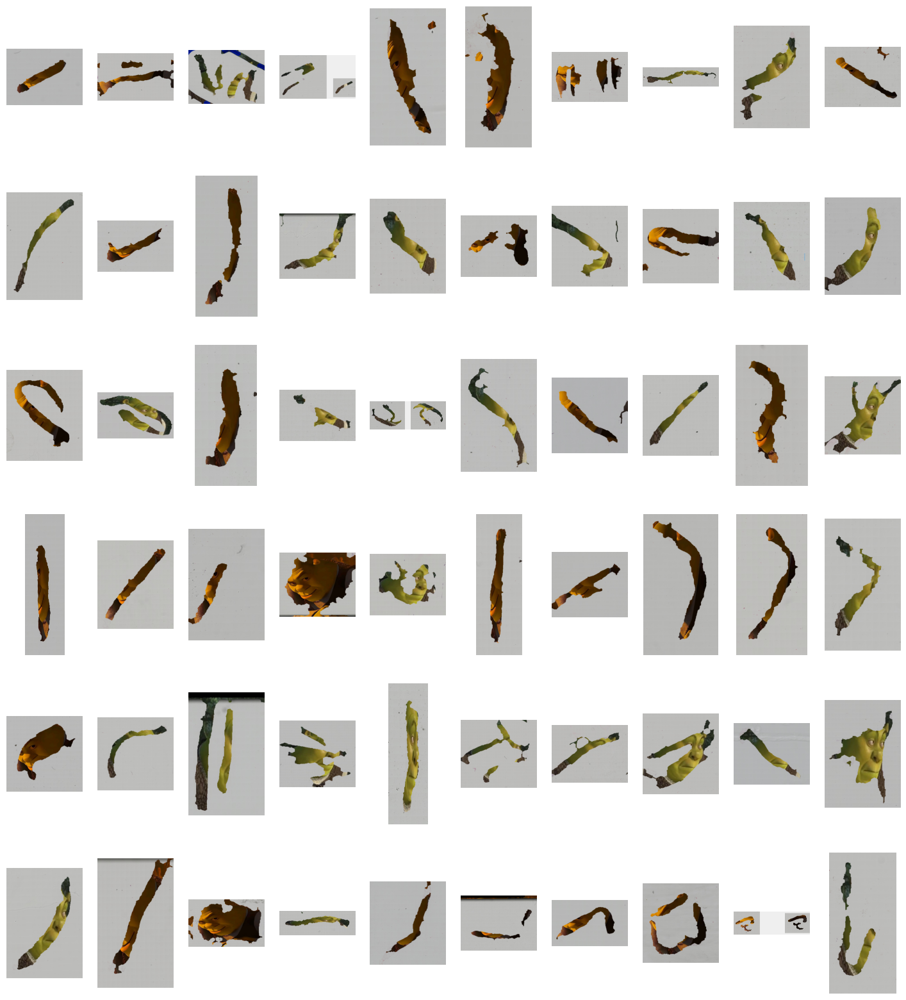

In [17]:
# @title Visual inspection of images recognized as Shrek

if DO_PLOT:
    # Load Shrek images
    shrek_imgs = load_images(TRAIN_DIR, shrek_list, load_mask=False)

    # Show images
    fig, axs = plt.subplots(len(shrek_list)//10, 10, figsize=(18, 20))
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        ax.imshow(shrek_imgs[i])
        ax.axis('off')

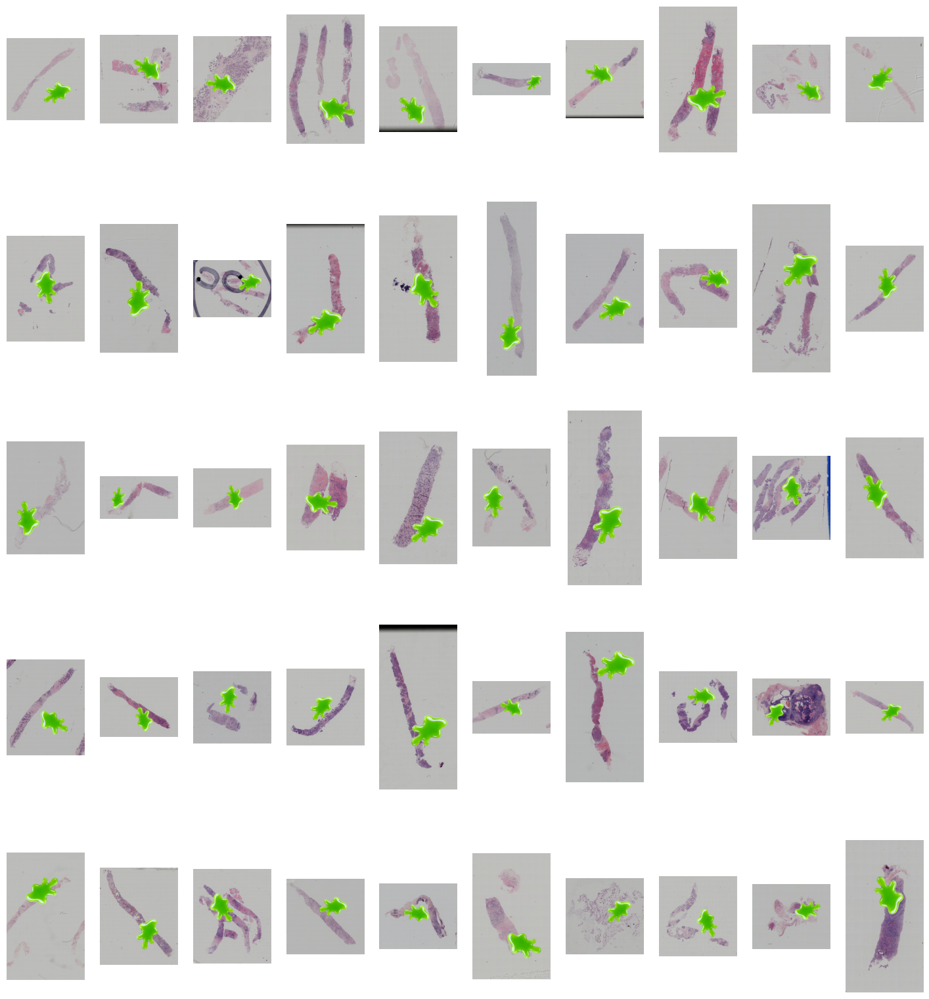

In [18]:
# @title Visual inspection of images recognized as slime

if DO_PLOT:
    # Load slime images
    slime_imgs = load_images(TRAIN_DIR, slime_list, load_mask=False)

    # Show images
    fig, axs = plt.subplots(len(slime_list)//10, 10, figsize=(18, 20))
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        ax.imshow(slime_imgs[i])
        ax.axis('off')

In [19]:
# @title Export of clean images

if CLEAN_DATA:
    # Create directory for clean images if it doesn't exist
    if not os.path.exists(CLEAN_TRAIN_DIR):
        os.mkdir(CLEAN_TRAIN_DIR)

    clean_train_labels = pd.DataFrame(columns=['sample_index', 'label'])

    print('Exporting clean images...')

    # Loop through training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # If the image is not dirty
        if i not in shrek_list and i not in slime_list:
            # Load image and mask
            img, mask = load_images(TRAIN_DIR, [i])

            img_filename = 'img_{:0>4}.png'.format(i)
            mask_filename = 'mask_{:0>4}.png'.format(i)
            label = train_labels[train_labels['sample_index'] == img_filename]['label'].values[0]

            # Save image and mask in directory for clean images
            shutil.copy(os.path.join(TRAIN_DIR, img_filename), os.path.join(CLEAN_TRAIN_DIR, img_filename))
            shutil.copy(os.path.join(TRAIN_DIR, mask_filename), os.path.join(CLEAN_TRAIN_DIR, mask_filename))

            clean_train_labels = pd.concat([clean_train_labels, pd.DataFrame({'sample_index': img_filename, 'label': label}, index=[0])])

    clean_train_labels.to_csv(os.path.join(DATASET_DIR, 'clean_train_labels.csv'), index=False)

    print(f'Number of clean images saved: {len(clean_train_labels)}')
else:
    clean_train_labels = pd.read_csv(os.path.join(DATASET_DIR, 'clean_train_labels.csv'))

## **Data pre-processing (trainset and testset)**

### **Background removal with Otsu's thresholding**

In [20]:
# @title Helper function

def apply_otsu_mask(img, relaxation=0.95):
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Apply Gaussian Blur
    # To enhance Otsu's thresholding
    gray_blur_img = cv2.GaussianBlur(gray_img, (5, 5), 0)

    # Otsu's Thresholding
    otsu_val, _ = cv2.threshold(gray_blur_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    adjusted_thresh = min(255, otsu_val * (1 / relaxation))
    _, mask = cv2.threshold(gray_blur_img, adjusted_thresh, 255, cv2.THRESH_BINARY_INV)

    # Apply Otsu's mask
    masked_img = cv2.bitwise_and(img, img, mask=mask)

    return masked_img

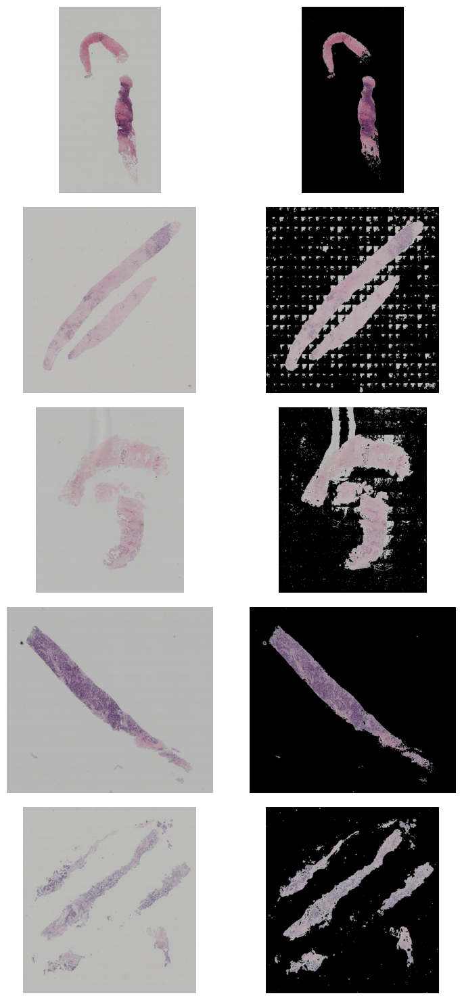

In [21]:
# @title Image without background overview

if DO_PLOT:
    # Number of images to display
    n_img = 5

    # Random image indices
    rand_idxs = np.random.choice(clean_list, n_img)

    # Load random images
    rand_imgs = load_images(TRAIN_DIR, rand_idxs, load_mask=False, normalize=False)

    # Applt Otsu's thresholding
    rand_masked_img = [ apply_otsu_mask(img) for img in rand_imgs ]

    # Plot
    fig, ax = plt.subplots(n_img, 2, figsize=(8, 15))

    for i in range(n_img):
        # Display image
        ax[i][0].imshow(rand_imgs[i])
        ax[i][0].axis('off')

        # Display image without background
        ax[i][1].imshow(rand_masked_img[i])
        ax[i][1].axis('off')

    # Plot
    plt.tight_layout()
    plt.show()

In [22]:
# @title Export of images without background

if REMOVE_BACKGROUND:
    # Create directories for background-free images if they don't exist
    if not os.path.exists(NOBG_TRAIN_DIR):
        os.mkdir(NOBG_TRAIN_DIR)
    if not os.path.exists(NOBG_TEST_DIR):
        os.mkdir(NOBG_TEST_DIR)

    print('Removing background from training images...')

    # Loop through clean training images
    for i in clean_list:
        # Load image
        img = load_images(CLEAN_TRAIN_DIR, [i], load_mask=False, normalize=False)[0]

        # Apply Otsu's thresholding
        masked_img = apply_otsu_mask(img)

        # Save image
        cv2.imwrite(os.path.join(NOBG_TRAIN_DIR, 'img_{:0>4}.png'.format(i)), masked_img)

    for i in range(0, N_TEST_IMAGES+1):
        # Load image
        img = load_images(TEST_DIR, [i], load_mask=False, normalize=False)[0]

        # Apply Otsu's thresholding
        masked_img = apply_otsu_mask(img)

        # Save image
        cv2.imwrite(os.path.join(NOBG_TEST_DIR, 'img_{:0>4}.png'.format(i)), masked_img)

    print('Background removal complete.')

### **Image patching**

In [23]:
# @title Helper function

def get_patches(img, patch_size=256, stride=256, tissue_threshold=0.1):
    """
    Extracts patches from an image, ignoring the black background.
    """

    patches = []

    h, w, _ = img.shape

    full_patches = []
    # Slide the Window
    for y in range(0, h - patch_size + 1, stride):
        for x in range(0, w - patch_size + 1, stride):

            # Extract patch
            patch = img[y:y+patch_size, x:x+patch_size]

            # Convert patch to grayscale
            gray_patch = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)

            # Count black pixels in patch
            black_pixels = np.sum(gray_patch == 0)

            total_pixels = patch_size * patch_size
            black_fraction = black_pixels / total_pixels
            tissue_fraction = 1 - black_fraction

            # Keep patch if it has more than a certain quantity of tissue
            if tissue_fraction > tissue_threshold:
                patches.append(patch)
            full_patches.append(patch)
    if len(patches) == 0:
        return full_patches

    return patches


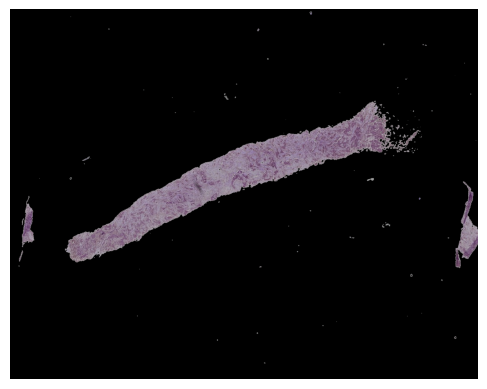

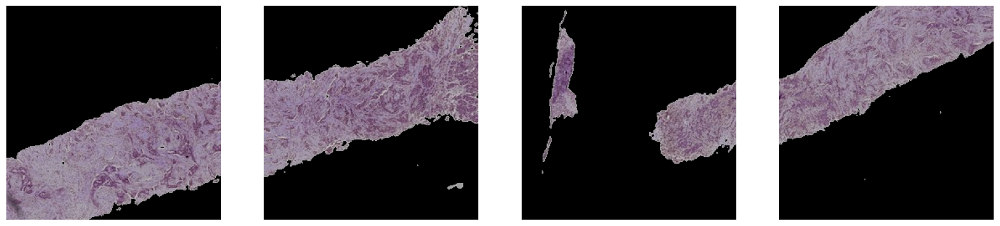

In [24]:
# @title Patches overview (no stride, patches with min. 10% of tissue)

if DO_PLOT:
    # Load image without background
    img = load_images(NOBG_TRAIN_DIR, [15], load_mask=False)[0]

    # Extract patches
    patches = get_patches(img)

    # Show image
    plt.imshow(img)
    plt.axis('off')

    # Show patches
    fig, axes = plt.subplots(1, len(patches), figsize=(20, 20))
    axes = axes.flatten()
    for i, patch in enumerate(patches):
        axes[i].imshow(patch)
        axes[i].axis('off')

In [25]:
# @title Load and export of images divided in patches

if CREATE_PATCHES:
    # Create directories for patches if they don't exist
    if not os.path.exists(NOBG_TRAIN_PATCH_DIR):
        os.mkdir(NOBG_TRAIN_PATCH_DIR)
    if not os.path.exists(NOBG_TEST_PATCH_DIR):
        os.mkdir(NOBG_TEST_PATCH_DIR)

    patch_labels = pd.DataFrame(columns=['sample_index', 'patch', 'label'])

    print('Exporting patches...')

    for i in clean_list:
        # Load image without background
        img = load_images(NOBG_TRAIN_DIR, [i], load_mask=False)[0]

        # Get label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        # Extract patches
        patches = get_patches(img, PATCH_SIZE, PATCH_STRIDE)

        for j, patch in enumerate(patches):
            # Denormalize and trasform to BGR, as requested by cv2 to save images
            patch = (patch * 255).astype(np.uint8)
            patch = cv2.cvtColor(patch, cv2.COLOR_RGB2BGR)

            # Save patch to disk
            img_name = 'img_{:0>4}.png'.format(i)
            patch_name = 'img_{:0>4}_patch_{}'.format(i, j)
            filename = patch_name + '.png'
            cv2.imwrite(os.path.join(NOBG_TRAIN_PATCH_DIR, filename), patch)

            # Add patch label
            new_row = pd.DataFrame({'sample_index': img_name, 'patch': patch_name, 'label': label}, index=[0])
            patch_labels = pd.concat([patch_labels, new_row], ignore_index=True)

    # Save train patch labels to disk
    patch_labels.to_csv(os.path.join(DATASET_DIR, 'patch_labels.csv'), index=False)

    for i in range(0, N_TEST_IMAGES+1):
        # Load image without background
        img = load_images(NOBG_TEST_DIR, [i], load_mask=False)[0]

        # Extract patches
        patches = get_patches(img, PATCH_SIZE, PATCH_STRIDE)

        for j, patch in enumerate(patches):
            # Denormalize
            patch = (patch * 255).astype(np.uint8)
            patch = cv2.cvtColor(patch, cv2.COLOR_RGB2BGR)

            # Save patch to disk
            img_name = 'img_{:0>4}.png'.format(i)
            patch_name = 'img_{:0>4}_patch_{}'.format(i, j)
            filename = patch_name + '.png'
            cv2.imwrite(os.path.join(NOBG_TEST_PATCH_DIR, filename), patch)

    print('Patches export complete.')
else:
    patch_labels = pd.read_csv(os.path.join(DATASET_DIR, 'patch_labels.csv'))

## **Data analysis**

### **Raw images**

Observations:
 - The color channel densities of all the images aggregated (sub-sampling each image to 10000px to reduce RAM occupation), plotted by label, do not show any discriminative pattern. The peaks are concentrated around 185-190 for all the channels and for all the target labels, these colors corresponds to light gray, that is the background of the histological samples. We conclude that the great majority of images are mostly composed of a gray background.
 - The PCA of the images once resized to 64x64px (to reduce RAM occupation) and flattened, keeping the first two principal components, shows no clear pattern w.r.t. target labels. That is to say, the four target classes are not linearly separable once projected on the first two PCs. This suggests that this image classification problem is hard and needs advanced architectures, such as CNNs.
 - The average images w.r.t. to target labels do not carry much information either, being useful just to confirm that most images are mainly composed of a graysh background.

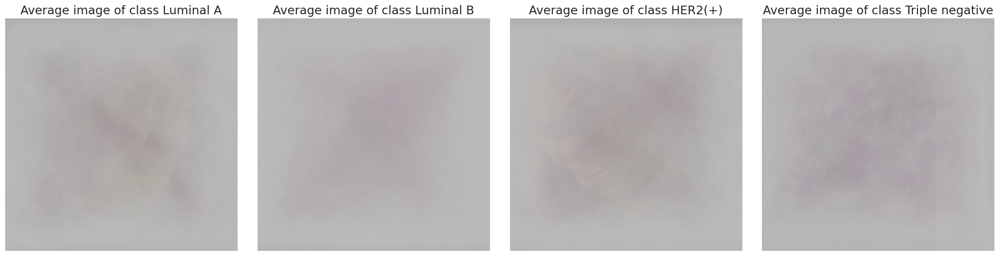

In [26]:
# @title Average images w.r.t. target labels

if DO_PLOT:
    IMG_SIZE = 1024

    avg_images = { label: np.zeros((IMG_SIZE, IMG_SIZE, 3))
                  for label in labels }

    # Loop through training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False)[0]

        # Resize image
        resized_img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

        # Get class label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        cv2.accumulate(resized_img, avg_images[label])

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    for i, label in enumerate(labels):
        # Divide cumulated image by number of samples with that label
        avg_images[label] = avg_images[label] / count_labels[label]

        # Plot
        axes[i].set_title(f'Average image of class {label}')
        axes[i].imshow(avg_images[label])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

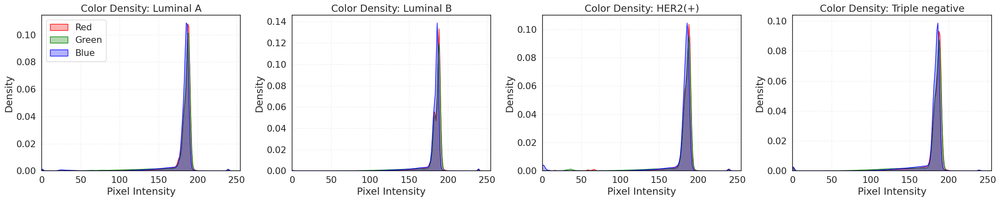

In [27]:
# @title Density of color channels w.r.t. target labels (images sub-sampled to reduce RAM occupation)

if DO_PLOT:
    img_by_label = { label: {ch: []
                            for ch in ['r', 'g', 'b']}
                    for label in labels }

    PIXELS_PER_IMAGE = 10000

    # Loop through all training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False, normalize=False)[0]

        # Get image label
        img_label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        # Extract and flatten the three color channels
        r_channel = img[:, :, 0].flatten()
        g_channel = img[:, :, 1].flatten()
        b_channel = img[:, :, 2].flatten()

        # Randomply sample the same pixel from all the channels
        # In order not to load all the full images in RAM
        # and add these color intensities to the dictionary bucket
        # of the corresponding label
        indices = np.random.choice(len(r_channel), PIXELS_PER_IMAGE, replace=False)
        img_by_label[img_label]['r'].extend(r_channel[indices])
        img_by_label[img_label]['g'].extend(g_channel[indices])
        img_by_label[img_label]['b'].extend(b_channel[indices])

    # Plot
    fig, axes = plt.subplots(1, 4, figsize=(24, 5))

    for i, label in enumerate(labels):
        ax = axes[i]

        sns.kdeplot(img_by_label[label]['r'], ax=ax, color='red', fill=True, alpha=0.3, label='Red')
        sns.kdeplot(img_by_label[label]['g'], ax=ax, color='green', fill=True, alpha=0.3, label='Green')
        sns.kdeplot(img_by_label[label]['b'], ax=ax, color='blue', fill=True, alpha=0.3, label='Blue')

        ax.set_title(f'Color Density: {label}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_xlim(0, 255)
        ax.grid(True, linestyle='--', alpha=0.3)

        if i == 0: ax.legend() # Only show legend on first plot

    plt.tight_layout()
    plt.show()


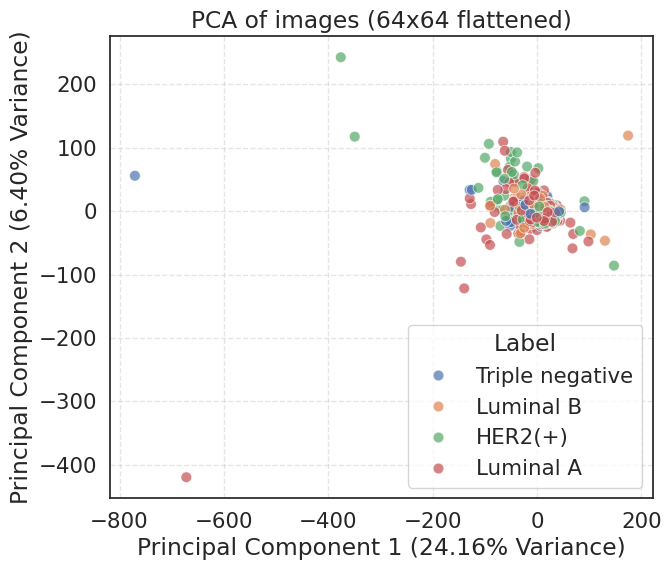

In [28]:
# @title PCA of raw images scaled to 64x64 (PC1 vs PC2)

if DO_PLOT:
    IMG_SIZE = 64

    imgs = []

    # Loop through training images
    for i in range(0, N_TRAIN_IMAGES+1):
        # Load image
        img = load_images(TRAIN_DIR, [i], load_mask=False)[0]

        # Resize image
        resized_img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

        # Flatten image
        flat_img = resized_img.flatten()

        # Get class label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        imgs.append(flat_img)

    scaler = StandardScaler()
    scaled_imgs = scaler.fit_transform(imgs)

    # Apply PCA
    pca = PCA(n_components=2)
    pca_imgs = pca.fit_transform(scaled_imgs)

    # Convert to DataFrame
    df_pca = pd.DataFrame(data=pca_imgs, columns=['PC1', 'PC2'])
    df_pca['Label'] = train_labels['label'].values

    # Plot
    plt.figure(figsize=(7, 6))
    sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Label', alpha=0.7, s=60)
    plt.title(f'PCA of images ({IMG_SIZE}x{IMG_SIZE} flattened)')
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} Variance)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} Variance)')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

### **Clean images (not dirty, no background)**

Observations:
 - Removing patently dirty images (Shrek, slime) and removing the background, doesn't ameliorate data analysis outcomes. The target labels are still undistinguishible w.r.t. to average images, color densities or PCA (on the first two principa components).
  - The background removal procedure worked well, since the densities of color channels show a great peak in small values (black background), and a smaller peak on the intensities corresponding to dark pink and purple (tissue). Unfortunately, the three classes show no discriminative pattern.

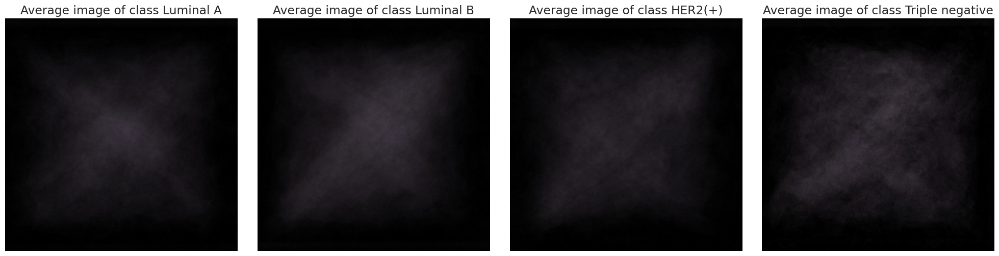

In [29]:
# @title Average images w.r.t. target labels

if DO_PLOT:
    IMG_SIZE = 1024

    avg_images = { label: np.zeros((IMG_SIZE, IMG_SIZE, 3))
                  for label in labels }

    # Loop through training images
    for i in clean_list:
        # Load image
        img = load_images(NOBG_TRAIN_DIR, [i], load_mask=False)[0]

        # Resize image
        resized_img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

        # Get class label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        cv2.accumulate(resized_img, avg_images[label])

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    for i, label in enumerate(labels):
        # Divide cumulated image by number of samples with that label
        avg_images[label] = avg_images[label] / count_labels[label]

        # Plot
        axes[i].set_title(f'Average image of class {label}')
        axes[i].imshow(avg_images[label])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

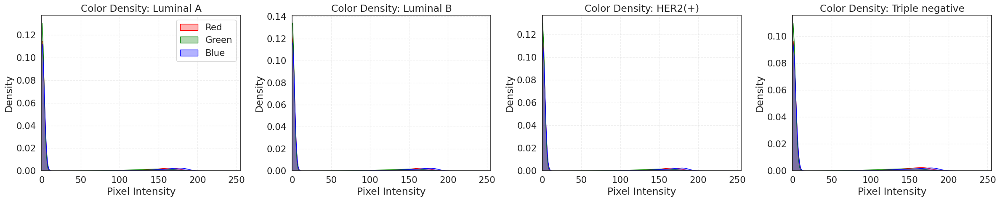

In [30]:
# @title Density of color channels w.r.t. target labels (images sub-sampled to reduce RAM occupation)

if DO_PLOT:
    img_by_label = { label: {ch: []
                            for ch in ['r', 'g', 'b']}
                    for label in labels }

    PIXELS_PER_IMAGE = 10000

    # Loop through all training images
    for i in clean_list:
        # Load image
        img = load_images(NOBG_TRAIN_DIR, [i], load_mask=False, normalize=False)[0]

        # Get image label
        img_label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        # Extract and flatten the three color channels
        r_channel = img[:, :, 0].flatten()
        g_channel = img[:, :, 1].flatten()
        b_channel = img[:, :, 2].flatten()

        # Randomply sample the same pixel from all the channels
        # In order not to load all the full images in RAM
        # and add these color intensities to the dictionary bucket
        # of the corresponding label
        indices = np.random.choice(len(r_channel), PIXELS_PER_IMAGE, replace=False)
        img_by_label[img_label]['r'].extend(r_channel[indices])
        img_by_label[img_label]['g'].extend(g_channel[indices])
        img_by_label[img_label]['b'].extend(b_channel[indices])

    # Plot
    fig, axes = plt.subplots(1, 4, figsize=(24, 5))

    for i, label in enumerate(labels):
        ax = axes[i]

        sns.kdeplot(img_by_label[label]['r'], ax=ax, color='red', fill=True, alpha=0.3, label='Red')
        sns.kdeplot(img_by_label[label]['g'], ax=ax, color='green', fill=True, alpha=0.3, label='Green')
        sns.kdeplot(img_by_label[label]['b'], ax=ax, color='blue', fill=True, alpha=0.3, label='Blue')

        ax.set_title(f'Color Density: {label}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_xlim(0, 255)
        ax.grid(True, linestyle='--', alpha=0.3)

        if i == 0: ax.legend() # Only show legend on first plot

    plt.tight_layout()
    plt.show()


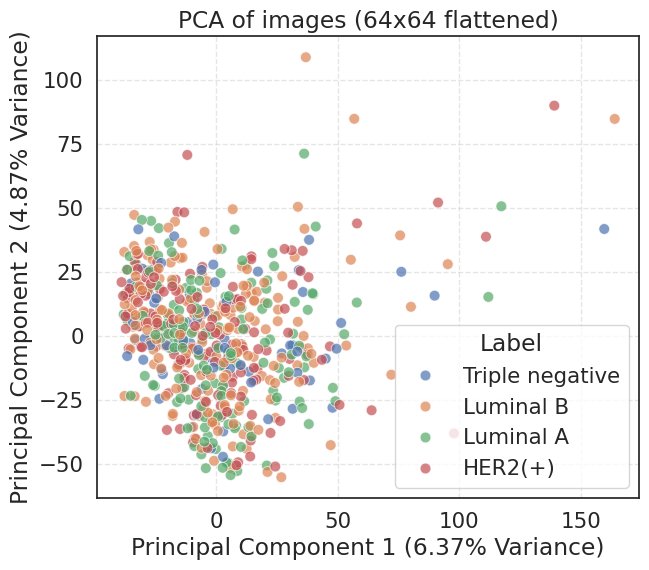

In [31]:
# @title PCA of raw images scaled to 64x64 (PC1 vs PC2)

if DO_PLOT:
    IMG_SIZE = 64

    imgs = []
    pca_labels = []

    # Loop through training images
    for i in clean_list:
        # Load image
        img = load_images(NOBG_TRAIN_DIR, [i], load_mask=False)[0]

        # Resize image
        resized_img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

        # Flatten image
        flat_img = resized_img.flatten()

        # Get class label
        label = train_labels[train_labels['sample_index'] == 'img_{:0>4}.png'.format(i)]['label'].values[0]

        imgs.append(flat_img)
        pca_labels.append(label)

    scaler = StandardScaler()
    scaled_imgs = scaler.fit_transform(imgs)

    # Apply PCA
    pca = PCA(n_components=2)
    pca_imgs = pca.fit_transform(scaled_imgs)

    # Convert to DataFrame
    df_pca = pd.DataFrame(data=pca_imgs, columns=['PC1', 'PC2'])
    df_pca['Label'] = pca_labels

    # Plot
    plt.figure(figsize=(7, 6))
    sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Label', alpha=0.7, s=60)
    plt.title(f'PCA of images ({IMG_SIZE}x{IMG_SIZE} flattened)')
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} Variance)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} Variance)')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

# **Models**

## **Helper functions**

In [32]:
# @title Loader helper
from torch.utils.data import DataLoader, WeightedRandomSampler
from collections import Counter


def make_loader(ds, batch_size, shuffle=True, drop_last=False, weight_sampler=False, limit_cpu=False):
    """Create a PyTorch DataLoader with optimized settings.

    If weight_sampler=True, automatically computes class-balanced sampling
    using WeightedRandomSampler.
    """

    cpu_cores = os.cpu_count() or 2
    num_workers = max(2, min(4, cpu_cores) if limit_cpu else cpu_cores)

    sampler = None

    if weight_sampler:
        # Extract labels
        labels = [ds[i][1] for i in range(len(ds))]
        class_counts = Counter(labels)

        # Compute per-class weights
        num_samples = len(labels)
        class_weights = {
            cls: num_samples / count
            for cls, count in class_counts.items()
        }

        # Assign weight per sample
        sample_weights = torch.tensor(
            [class_weights[label] for label in labels],
            dtype=torch.double
        )

        sampler = WeightedRandomSampler(
            weights=sample_weights,
            num_samples=len(sample_weights),
            replacement=True
        )

        shuffle = False  # must be False when using sampler

    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle if sampler is None else False,
        sampler=sampler,
        drop_last=drop_last,
        num_workers=num_workers,
        pin_memory=True,
        pin_memory_device="cuda" if torch.cuda.is_available() else "",
        prefetch_factor=4,
    )

In [33]:
# @title Training helpers

# Changed training functions to support patch voting
def train_one_epoch(model, train_loader, criterion, optimizer, scaler, device):
    """Train for one epoch."""
    model.train()

    running_loss = 0.0
    all_predictions = []
    all_targets = []

    for inputs, targets, _ in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
            logits = model(inputs)
            loss = criterion(logits, targets)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * inputs.size(0)
        predictions = logits.argmax(dim=1)
        all_predictions.append(predictions.cpu().numpy())
        all_targets.append(targets.cpu().numpy())

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_f1 = f1_score(
        np.concatenate(all_targets),
        np.concatenate(all_predictions),
        average="weighted"
    )

    return epoch_loss, epoch_f1

def validate_one_epoch(model, val_loader, criterion, device, use_voting = True, VOTING_STRATEGY="avg", use_tta=False):
    """Validate for one epoch."""
    model.eval()

    running_loss = 0.0

    # Store data for aggregation
    all_probs = []
    all_targets = []
    all_image_ids = []

    with torch.no_grad():
        for inputs, targets, paths in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                logits = model(inputs)
                loss = criterion(logits, targets)

            running_loss += loss.item() * inputs.size(0)

            # Softmax for probabilities
            probs = torch.softmax(logits, dim=1)

            all_probs.append(probs.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

            # Extract image IDs from paths
            # paths is a tuple of strings
            batch_image_ids = [p for p in paths]
            all_image_ids.extend(batch_image_ids)

    epoch_loss = running_loss / len(val_loader.dataset)

    if use_voting:
        # Aggregate by image
        all_probs = np.concatenate(all_probs)
        all_targets = np.concatenate(all_targets)

        image_probs = defaultdict(list)
        image_true_labels = {}

        for i, image_id in enumerate(all_image_ids):
            image_probs[image_id].append(all_probs[i])
            image_true_labels[image_id] = all_targets[i]

        final_predictions = []
        final_targets = []

        for image_id in image_probs:
            # Average Voting
            probs = np.array(image_probs[image_id])
            if VOTING_STRATEGY == "avg":
                avg_prob = np.mean(probs, axis=0)
                pred_class = np.argmax(avg_prob)
            elif VOTING_STRATEGY.startswith("top_k"):
                k = int(VOTING_STRATEGY.split("_")[-1])
                # 1. Calculate confidence for each tile (max probability)
                confidences = np.max(probs, axis=1)
                # 2. Get indices of top K confident tiles
                # If we have fewer than k tiles, take all of them
                k_actual = min(k, len(probs))
                top_k_indices = np.argsort(confidences)[::-1][:k_actual]

                # 3. Filter probabilities and Average
                top_k_probs = probs[top_k_indices]
                avg_prob = np.mean(top_k_probs, axis=0)
                pred_class = np.argmax(avg_prob)
            else:
                # Majority Voting
                # Get class prediction for each tile
                tile_preds = np.argmax(probs, axis=1)
                # Find the most frequent class
                counts = np.bincount(tile_preds)
                pred_class = np.argmax(counts)

            final_predictions.append(pred_class)
            final_targets.append(image_true_labels[image_id])
    else:
        final_predictions = np.concatenate(all_probs).argmax(axis=1)
        final_targets = np.concatenate(all_targets)

    epoch_f1 = f1_score(
        final_targets,
        final_predictions,
        average="weighted"
    )

    return epoch_loss, epoch_f1

def fit(model, train_loader, val_loader, epochs, criterion, optimizer, scaler, device,
        patience=0, evaluation_metric="val_acc", mode='max', scheduler=None,
        restore_best_weights=True, writer=None, verbose=1, experiment_name="", use_voting=True):
    """Train the neural network model."""

    training_history = {
        'train_loss': [], 'val_loss': [],
        'train_acc': [], 'val_acc': []
    }


    # Initialize best tracking variables
    best_metric = float('-inf') if mode == 'max' else float('inf')
    best_epoch = 0

    if patience > 0:
        patience_counter = 0

    print(f"Training {epochs} epochs...")

    epoch = 0
    try:
        for epoch in range(1, epochs + 1):
            train_loss, train_acc = train_one_epoch(
                model, train_loader, criterion, optimizer, scaler, device
            )

            val_loss, val_acc = validate_one_epoch(
                model, val_loader, criterion, device, use_voting=use_voting
            )

            training_history['train_loss'].append(train_loss)
            training_history['val_loss'].append(val_loss)
            training_history['train_acc'].append(train_acc)
            training_history['val_acc'].append(val_acc)

            if scheduler is not None:
                # For ReduceLROnPlateau, we pass the metric we want to monitor (Validation F1)
                # If you were using a different scheduler like StepLR, you would just call scheduler.step()
                scheduler.step(val_acc)

                # Optional: Print LR to see it change
                current_lr = optimizer.param_groups[0]['lr']
                if verbose > 0 and epoch % verbose == 0:
                    print(f"  (Current LR: {current_lr:.6f})")

            if writer is not None:
                writer.add_scalar('Loss/Training', train_loss, epoch)
                writer.add_scalar('Loss/Validation', val_loss, epoch)
                writer.add_scalar('F1/Training', train_acc, epoch)
                writer.add_scalar('F1/Validation', val_acc, epoch)

            # Track best metric
            current_metric = training_history[evaluation_metric][-1]
            is_improvement = (current_metric > best_metric) if mode == 'max' else (current_metric < best_metric)

            if is_improvement:
                best_metric = current_metric
                best_epoch = epoch
                if patience > 0:
                    torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')
                    patience_counter = 0
            else:
                if patience > 0:
                    patience_counter += 1

            if verbose > 0:
                if epoch % verbose == 0 or epoch == 1:
                    print(f"Epoch {epoch:3d}/{epochs} | "
                        f"Train: Loss={train_loss:.4f}, F1={train_acc:.4f} | "
                        f"Val: Loss={val_loss:.4f}, F1={val_acc:.4f} | "
                        f"Best: {best_metric:.4f} at epoch {best_epoch}")

            if patience > 0 and patience_counter >= patience:
                print(f"Early stopping triggered after {epoch} epochs.")
                break

    except KeyboardInterrupt:
        print(f"\nTraining manually stopped at epoch {epoch}.")

    if restore_best_weights and patience > 0:
        if best_epoch > 0:
            model.load_state_dict(torch.load("models/"+experiment_name+'_model.pt'))
            print(f"Best model restored from epoch {best_epoch} with {evaluation_metric} {best_metric:.4f}")

    if patience == 0:
        torch.save(model.state_dict(), "models/"+experiment_name+'_model.pt')

    if writer is not None:
        writer.close()

    return model, training_history

In [34]:
# @title Loss functions

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2, reduction='mean'):
        """
        Args:
            alpha (Tensor, optional): Weights for each class.
                                      If provided, it should be a tensor of size (C).
            gamma (float, optional): Focusing parameter. Default: 2.
            reduction (str, optional): Specifies the reduction to apply to the output:
                                       'none' | 'mean' | 'sum'. Default: 'mean'.
        """
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Calculate standard Cross Entropy Loss (element-wise)
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)

        # Calculate probabilities (pt)
        pt = torch.exp(-ce_loss)

        # Calculate Focal Loss
        # Formula: -alpha * (1-pt)^gamma * log(pt)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss

        # Apply reduction
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

In [35]:
# @title Patched trainset
# No Albumentations

class PatchDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, dataframe, transform=None):
        self.data = dataframe
        self.transform = transform
        self.dir = img_dir
        self.preloaded_images = None

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]

        # Load Image
        filename = row['patch'] + '.png'
        if self.preloaded_images is not None:
            img = self.preloaded_images[idx]
        else:
            img = load_images(self.dir, [filename], load_mask=False)[0]

        # Apply trasformations
        if self.transform:
            img = self.transform(img)

        # Return image, label and parent image (from which it was patched)
        return img, row['label'], row['sample_index']

    def preload_to_ram(self):
        self.preloaded_images = []
        for idx in range(len(self.data)):
            row = self.data.iloc[idx]
            filename = row['patch'] + '.png'
            img = load_images(self.dir, [filename], load_mask=False)[0]
            self.preloaded_images.append(img)



In [36]:
# @title Test-time augmentation helper function

def predict_with_d4_tta(model, inputs):
    """
    Performs Dihedral TTA (8 views: 4 rotations + flips).
    Returns averaged probabilities.
    """
    model.eval()
    total_probs = None
    n_views = 0

    # Standard: 0, 90, 180, 270 degrees
    for k in [0, 1, 2, 3]:
        rotated_inputs = torch.rot90(inputs, k=k, dims=[2, 3])

        # Rotate
        with torch.no_grad():
            logits = model(rotated_inputs)
            probs = torch.softmax(logits, dim=1)

        if total_probs is None: total_probs = probs
        else: total_probs += probs
        n_views += 1

        # Flip
        flipped_inputs = torch.flip(rotated_inputs, dims=[3])
        with torch.no_grad():
            logits_f = model(flipped_inputs)
            probs_f = torch.softmax(logits_f, dim=1)

        total_probs += probs_f
        n_views += 1

    return total_probs / n_views


## **Pre-processing**

In [37]:
# @title Parameters

BATCH_SIZE = 32

resnet50_norm_param = [(1.485, 0.456, 0.406), (0.229, 0.224, 0.225)]

NORM_MEAN = resnet50_norm_param[0]
NORM_STD = resnet50_norm_param[1]

# String to number (and viceversa) mapping for target labels
LABEL_MAP = {
    'Luminal A': 0,
    'Luminal B': 1,
    'HER2(+)': 2,
    'Triple negative': 3
}
INVERSE_LABEL_MAP = { v: k for k, v in LABEL_MAP.items() }

In [38]:
# @title Compute mean and std of trainset

if COMPUTE_MEAN_STD_DATASET:
    def get_mean_std(loader):
        # Variables to accumulate sum and squared sum
        channels_sum, channels_squared_sum, num_batches = 0, 0, 0

        print("Computing mean and std...")

        # Loop through the dataset
        for data, y, _ in loader:
            # Data shape: [Batch_Size, Channels, Height, Width]

            # Mean over height and width, but keep batch and channels
            # resulting shape: [Batch_Size, Channels]
            # Then mean over the batch
            channels_sum += torch.mean(data, dim=[0, 2, 3])
            channels_squared_sum += torch.mean(data**2, dim=[0, 2, 3])
            num_batches += 1

        # Calculate final mean and std
        mean = channels_sum / num_batches
        std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

        return mean, std

    # ToTensor trasformation
    simple_transform = transforms.Compose([transforms.ToTensor()])

    # Temporary dataset and dataloader
    calc_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, patch_labels, simple_transform)
    calc_loader = DataLoader(calc_dataset, batch_size=32, shuffle=False, num_workers=2)

    # Compute mean and set
    my_mean, my_std = get_mean_std(calc_loader)

    print(f"Dataset mean: {my_mean}")
    print(f"Dataset std:  {my_std}")
else:
    my_mean = torch.tensor([0.2225, 0.1981, 0.2295])
    my_std = torch.tensor([0.2980, 0.2724, 0.3085])

In [39]:
# @title Image trasformations (Albumentation, removed)

# train_transform = A.Compose([
#     A.Resize(224, 224),

#     # Geometric transformation
#     A.HorizontalFlip(p=0.5),
#     A.VerticalFlip(p=0.5),
#     A.Rotate(limit=179, p=0.7),

#     # Normalization
#     A.Normalize(mean=NORM_MEAN, std=NORM_STD),
#     ToTensorV2()
# ])

# val_transform = A.Compose([
#     A.Resize(224, 224),
#     A.Normalize(mean=NORM_MEAN, std=NORM_STD),
#     ToTensorV2()
# ])

In [40]:
from torchvision.transforms import v2
from torchvision.transforms.v2 import InterpolationMode
# @title Image transformations (Torchvision v2)

train_transform = v2.Compose([

    # Geometric transforms
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.RandomRotation(degrees=179),

    # Convert to tensor
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),

    # AutoAugmentation
    #v2.AutoAugment(),
    v2.TrivialAugmentWide(),
    # Normalization
    v2.Normalize(mean=NORM_MEAN, std=NORM_STD),
    v2.Resize((224, 224), interpolation=InterpolationMode.BILINEAR),
])

val_transform = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=NORM_MEAN, std=NORM_STD),
    v2.Resize((224, 224), interpolation=InterpolationMode.BILINEAR),
])


In [41]:
# @title Train-validation-test splitting

# Train-test-validation splitting of clean images
train_df, valtest_df = train_test_split(clean_train_labels, test_size=0.3, random_state=SEED, stratify=clean_train_labels['label'])
val_df, test_df = train_test_split(valtest_df, test_size=0.25, random_state=SEED, stratify=valtest_df['label'])

In [42]:
# @title Mapping target labels from textual to numerical

# Transform labels from strings to numbers in each split
train_df['label'] = train_df['label'].map(lambda x: LABEL_MAP[x])
val_df['label'] = val_df['label'].map(lambda x: LABEL_MAP[x])
test_df['label'] = test_df['label'].map(lambda x: LABEL_MAP[x])

# Transform labels from strings to numbers in patches dataset
patch_labels['label'] = patch_labels['label'].map(lambda x: LABEL_MAP[x])

print(f"Label mapping: {LABEL_MAP}")

Label mapping: {'Luminal A': 0, 'Luminal B': 1, 'HER2(+)': 2, 'Triple negative': 3}


In [43]:
# @title Patches of train-validation-test

# Corresponding splitting of patches
# To avoid leakage of patches of training images in validation or testing datasets
patch_train_df = patch_labels[patch_labels['sample_index'].isin(train_df['sample_index'])]
patch_val_df = patch_labels[patch_labels['sample_index'].isin(val_df['sample_index'])]
patch_test_df = patch_labels[patch_labels['sample_index'].isin(test_df['sample_index'])]

In [44]:
# @title Create datasets

train_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, patch_train_df, transform=train_transform)
val_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, patch_val_df, transform=val_transform)
test_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, patch_test_df, transform=val_transform)

In [45]:
# @title Create loaders

train_loader = make_loader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=False)
val_loader = make_loader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)
test_loader = make_loader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

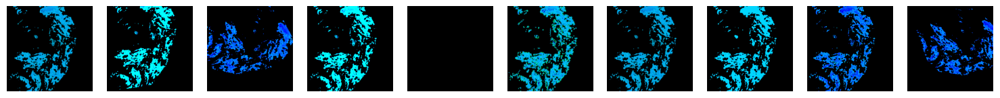

In [46]:
# @title Visual inspection of transformations

if DO_PLOT:
    n_trasf_loop = 10

    fig, axes = plt.subplots(1, n_trasf_loop, figsize=(15, 3))
    axes = axes.flatten()

    for i in range(n_trasf_loop):
        # Get an image (e.g. 20)
        img_tensor, label, parent_id = train_dataset[20]

        # Reorder axes (C, H, W) to (H, W, C)
        img = img_tensor.permute(1, 2, 0).cpu().numpy()

        # Transform image
        img_transformed = train_transform(img).permute(1, 2, 0).cpu().numpy()

        # Denormalize image
        img_transformed = my_std * img_transformed + my_mean
        img_transformed = np.clip(img_transformed, 0, 1)

        # Plot
        axes[i].imshow(img_transformed)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


In [47]:
for xb, yb, _ in train_loader:
    print(f'Input feature shape: {xb.shape}')
    print(f'Label shape: {len(yb)}')
    break

input_shape = train_dataset[0][0].shape
print(f'Input shape: {input_shape}')

Input feature shape: torch.Size([32, 3, 224, 224])
Label shape: 32
Input shape: torch.Size([3, 224, 224])


## **CNN (end-to-end)**

In [48]:
# @title Hyperparameters

LEARNING_RATE = 1e-3
EPOCHS = 1000
PATIENCE = 200

# Regularisation
DROPOUT_RATE = 0.35
L1_LAMBDA = 0
L2_LAMBDA = 0

# Loss function
count_labels = patch_train_df['label'].value_counts().sort_index()
weights = (count_labels.sum() / (len(LABEL_MAP) * count_labels)).values.astype(np.float32)
loss_weigths = torch.tensor(weights).to(device)
CRITERION = nn.CrossEntropyLoss(weight=loss_weigths)

EXPERIMENT_NAME = f'CNN_patch_lr{LEARNING_RATE}_ep{EPOCHS}_pat{PATIENCE}_dr{DROPOUT_RATE}_las{L1_LAMBDA}_lr{L2_LAMBDA}_weightce'

In [49]:
 # @title Architecture of Roy et al. (2019) with customizations
 # "Patch-based system for Classification of Breast Histology images using deep learning", Kaushiki et al., 2018

class CustomCNN(nn.Module):
    def __init__(self, dropout=0):
        super(CustomCNN, self).__init__()

        # Layer 1: Convolution
        # Input: 3 x 256 x 256
        # Output: 8 x 256 x 256
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3, padding=1)

        # Layer 2: Max Pooling
        # Output: 8 x 85 x 85
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=3)

        # Layer 3: Convolution
        # Output: 12 x 85 x 85
        self.conv3 = nn.Conv2d(in_channels=8, out_channels=12, kernel_size=3, padding=1)

        # Layer 4: Max Pooling
        # Output: 12 x 42 x 42
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Layer 5: Convolution
        # Output: 24 x 42 x 42
        self.conv5 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=3, padding=1)

        # Layer 6: Max Pooling
        # Output: 24 x 21 x 21
        self.pool6 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Layer 7: Convolution
        # Output: 24 x 21 x 21
        self.conv7 = nn.Conv2d(in_channels=24, out_channels=24, kernel_size=3, padding=1)

        # Layer 8: Max Pooling
        # Output: 24 x 7 x 7
        self.pool8 = nn.MaxPool2d(kernel_size=3, stride=3)

        # Layer 9: Convolution
        # Output: 12 x 7 x 7
        self.conv9 = nn.Conv2d(in_channels=24, out_channels=12, kernel_size=3, padding=1)

        # Layer 10: Max Pooling
        # Output: 12 x 2 x 2
        self.pool10 = nn.MaxPool2d(kernel_size=3, stride=3)

        # Layer 11: Convolution
        # Output: 6 x 2 x 2
        self.conv11 = nn.Conv2d(in_channels=12, out_channels=6, kernel_size=3, padding=1)

        # Flattening
        # Final Feature Map is 6 channels of 2x2 images.
        # Calculation: 6 * 2 * 2 = 24
        self.flatten_size = 6 * 2 * 2  # = 24

        # Layer 12: Fully Connected
        self.fc12 = nn.Linear(self.flatten_size, 100)
        self.dropout12 = nn.Dropout(p=dropout)

        # Layer 13: Fully Connected
        self.fc13 = nn.Linear(100, 60)
        self.dropout13 = nn.Dropout(p=dropout)

        # Layer 14: Fully Connected
        self.fc14 = nn.Linear(60, 4)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool2(x)

        x = F.relu(self.conv3(x))
        x = self.pool4(x)

        x = F.relu(self.conv5(x))
        x = self.pool6(x)

        x = F.relu(self.conv7(x))
        x = self.pool8(x)

        x = F.relu(self.conv9(x))
        x = self.pool10(x)

        x = F.relu(self.conv11(x))

        x = torch.flatten(x, 1)

        x = F.relu(self.fc12(x))
        x = self.dropout12(x)
        x = F.relu(self.fc13(x))
        x = self.dropout13(x)
        x = self.fc14(x)

        return x

### **Training**

In [50]:
# @title Model summary

# Instantiate CNN model and move to computing device (CPU/GPU)
cnn_model = CustomCNN(dropout=DROPOUT_RATE).to(device)

# Display model architecture summary
summary(cnn_model, input_size=input_shape)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 224, 224]             224
         MaxPool2d-2            [-1, 8, 74, 74]               0
            Conv2d-3           [-1, 12, 74, 74]             876
         MaxPool2d-4           [-1, 12, 37, 37]               0
            Conv2d-5           [-1, 24, 37, 37]           2,616
         MaxPool2d-6           [-1, 24, 18, 18]               0
            Conv2d-7           [-1, 24, 18, 18]           5,208
         MaxPool2d-8             [-1, 24, 6, 6]               0
            Conv2d-9             [-1, 12, 6, 6]           2,604
        MaxPool2d-10             [-1, 12, 2, 2]               0
           Conv2d-11              [-1, 6, 2, 2]             654
           Linear-12                  [-1, 100]           2,500
          Dropout-13                  [-1, 100]               0
           Linear-14                   

In [51]:
# @title Scaler and Optimizer

# Set up TensorBoard logging and save model architecture
writer = SummaryWriter("./"+logs_dir+"/"+EXPERIMENT_NAME)
x = torch.randn(1, input_shape[0], input_shape[1], input_shape[2]).to(device)
writer.add_graph(cnn_model, x)

# Define optimizer with L2 regularization
OPTIMIZER = torch.optim.AdamW(cnn_model.parameters(), lr=LEARNING_RATE, weight_decay=L2_LAMBDA)

# Enable mixed precision training for GPU acceleration
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))

In [52]:
# @title Training loop

%%time
# Train model and track training history
cnn_model, training_history = fit(
    model=cnn_model,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=CRITERION,
    optimizer=OPTIMIZER,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name=EXPERIMENT_NAME,
    patience=PATIENCE
)

Training 1000 epochs...
Epoch   1/1000 | Train: Loss=1.3882, F1=0.1703 | Val: Loss=1.3854, F1=0.1070 | Best: 0.1070 at epoch 1
Epoch   2/1000 | Train: Loss=1.3871, F1=0.2460 | Val: Loss=1.3830, F1=0.1161 | Best: 0.1161 at epoch 2
Epoch   3/1000 | Train: Loss=1.3875, F1=0.2550 | Val: Loss=1.3827, F1=0.1070 | Best: 0.1161 at epoch 2
Epoch   4/1000 | Train: Loss=1.3875, F1=0.2203 | Val: Loss=1.3856, F1=0.1070 | Best: 0.1161 at epoch 2

Training manually stopped at epoch 5.
Best model restored from epoch 2 with val_acc 0.1161
CPU times: user 27 s, sys: 4.94 s, total: 32 s
Wall time: 2min 8s


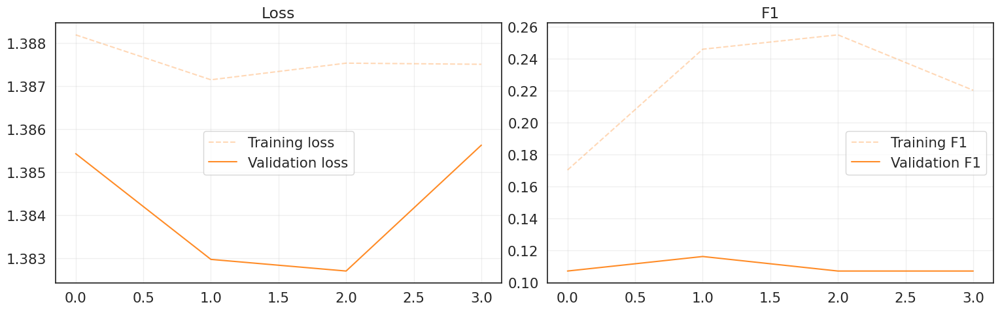

In [54]:
# @title Plot training history
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(training_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(training_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(training_history['train_acc'], label='Training F1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(training_history['val_acc'], label='Validation F1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

Evaluating Average Voting...
Average Voting F1 Score: 0.1542
Evaluating Majority Voting...
Majority Voting F1 Score: 0.1673
Evaluating Top-K Voting (K=3)...
Top-K (5) Voting F1 Score: 0.1728


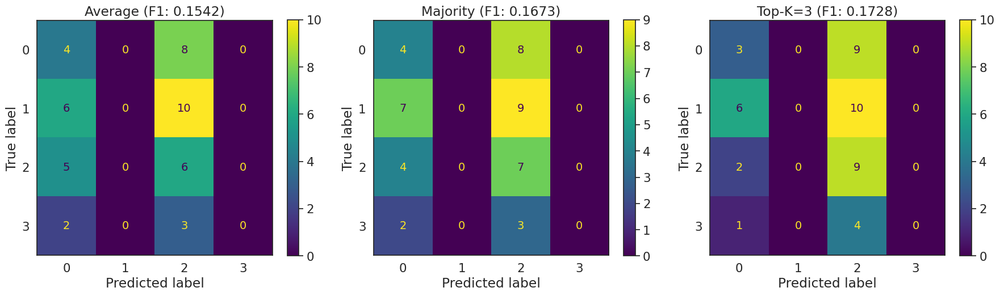

In [56]:
# @title Evaluation on testset (majority voting, average voting, top-k)

import torch
import numpy as np
from collections import defaultdict
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def evaluate_model(model, loader, device, voting_strategy="avg", tta=False):
    model.eval()
    all_probs = []
    all_targets = []
    all_image_ids = []

    with torch.no_grad():
        for inputs, targets, paths in loader:
            inputs, targets = inputs.to(device), targets.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                # --- TTA LOGIC START ---
                if tta:
                    # TTA returns already averaged probabilities
                    probs = predict_with_d4_tta(model, inputs)
                else:
                    # Standard inference
                    logits = model(inputs)
                    probs = torch.softmax(logits, dim=1)
                # --- TTA LOGIC END ---

            all_probs.append(probs.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

            # Extract image IDs from paths
            batch_image_ids = [p for p in paths]
            all_image_ids.extend(batch_image_ids)

    # Aggregate by image
    all_probs = np.concatenate(all_probs)
    all_targets = np.concatenate(all_targets)

    image_probs = defaultdict(list)
    image_true_labels = {}

    for i, image_id in enumerate(all_image_ids):
        image_probs[image_id].append(all_probs[i])
        image_true_labels[image_id] = all_targets[i]

    final_predictions = []
    final_targets = []

    for image_id in image_probs:
        probs = np.array(image_probs[image_id])

        # --- VOTING STRATEGIES ---
        if voting_strategy == "avg":
            avg_prob = np.mean(probs, axis=0)
            pred_class = np.argmax(avg_prob)

        elif voting_strategy == "majority":
            tile_preds = np.argmax(probs, axis=1)
            # Ensure we count up to num_classes
            counts = np.bincount(tile_preds, minlength=probs.shape[1])
            pred_class = np.argmax(counts)

        elif voting_strategy.startswith("top_k"):
            # Parse K from string (e.g., "top_k_5" -> 5)
            try:
                k = int(voting_strategy.split("_")[-1])
            except ValueError:
                raise ValueError("Top-K strategy must be in format 'top_k_<number>' (e.g., 'top_k_5')")

            # 1. Calculate confidence for each tile (max probability)
            confidences = np.max(probs, axis=1)

            # 2. Get indices of top K confident tiles
            # If we have fewer than k tiles, take all of them
            k_actual = min(k, len(probs))
            top_k_indices = np.argsort(confidences)[::-1][:k_actual]

            # 3. Filter probabilities and Average
            top_k_probs = probs[top_k_indices]
            avg_prob = np.mean(top_k_probs, axis=0)
            pred_class = np.argmax(avg_prob)

        else:
             raise ValueError(f"Unknown voting strategy: {voting_strategy}")

        final_predictions.append(pred_class)
        final_targets.append(image_true_labels[image_id])

    return np.array(final_targets), np.array(final_predictions)

# --- EXECUTION & PLOTTING ---

# 1. Evaluate Average Voting
print("Evaluating Average Voting...")
targets_avg, preds_avg = evaluate_model(cnn_model, test_loader, device, voting_strategy="avg", tta=True)
f1_avg = f1_score(targets_avg, preds_avg, average="weighted")
print(f"Average Voting F1 Score: {f1_avg:.4f}")

# 2. Evaluate Majority Voting
print("Evaluating Majority Voting...")
targets_maj, preds_maj = evaluate_model(cnn_model, test_loader, device, voting_strategy="majority", tta=True)
f1_maj = f1_score(targets_maj, preds_maj, average="weighted")
print(f"Majority Voting F1 Score: {f1_maj:.4f}")

# 3. Evaluate Top-K Voting (Example: Top 5 tiles)
print("Evaluating Top-K Voting (K=3)...")
targets_topk, preds_topk = evaluate_model(cnn_model, test_loader, device, voting_strategy="top_k_3", tta=True)
f1_topk = f1_score(targets_topk, preds_topk, average="weighted")
print(f"Top-K (5) Voting F1 Score: {f1_topk:.4f}")

# Plot confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

cm_avg = confusion_matrix(targets_avg, preds_avg)
disp_avg = ConfusionMatrixDisplay(confusion_matrix=cm_avg)
disp_avg.plot(ax=axes[0])
axes[0].set_title(f"Average (F1: {f1_avg:.4f})")

cm_maj = confusion_matrix(targets_maj, preds_maj)
disp_maj = ConfusionMatrixDisplay(confusion_matrix=cm_maj)
disp_maj.plot(ax=axes[1])
axes[1].set_title(f"Majority (F1: {f1_maj:.4f})")

cm_topk = confusion_matrix(targets_topk, preds_topk)
disp_topk = ConfusionMatrixDisplay(confusion_matrix=cm_topk)
disp_topk.plot(ax=axes[2])
axes[2].set_title(f"Top-K=3 (F1: {f1_topk:.4f})")

plt.tight_layout()
plt.show()

## **Transfer Learning**

In [ ]:
train_dataset.preload_to_ram()
val_dataset.preload_to_ram()

In [57]:
# @title Hyperparameters

LEARNING_RATE = 1e-3
EPOCHS = 1000
PATIENCE = 100

# Regularisation
DROPOUT_RATE = 0.35
L1_LAMBDA = 0
L2_LAMBDA = 1e-2
HIDDEN_UNITS = 64

# Loss function
count_labels = patch_train_df['label'].value_counts().sort_index()
weights = (count_labels.sum() / (len(LABEL_MAP) * count_labels)).values.astype(np.float32)
loss_weigths = torch.tensor(weights).to(device)
# CRITERION = FocalLoss(alpha=loss_weigths, gamma=2.0)
CRITERION = nn.CrossEntropyLoss(weight=loss_weigths)

EXPERIMENT_NAME = f'Resnet50TF_TrivialAUG_patch_lr{LEARNING_RATE}_ep{EPOCHS}_pat{PATIENCE}_dr{DROPOUT_RATE}_las{L1_LAMBDA}_lr{L2_LAMBDA}_hu{HIDDEN_UNITS}_wce'

### **Architectures**

In [58]:
# @title ResNet50 Transfer learning

class Resnet50TransferLearning(nn.Module):
    """ResNet-50 with ImageNet pretrained weights."""

    def __init__(self, num_classes, dropout_rate=0.3, freeze_backbone=True, hidden_neurons=256):
        super().__init__()

        # Load weights pretrained on ImageNet
        self.backbone = torchvision.models.resnet50(
            weights=torchvision.models.ResNet50_Weights.DEFAULT
        )

        # Freeze the backbone layers
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

        # Replace classifier (Always trainable)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Linear(in_features, hidden_neurons),
            nn.ReLU(),
            nn.Dropout(p=dropout_rate),
            nn.Linear(hidden_neurons, num_classes),
        )

    def forward(self, x):
        return self.backbone(x)

    def get_features(self, x):
        # Extract features using all layers except the last one (fc)
        features = nn.Sequential(*list(self.backbone.children())[:-1])(x)
        return torch.flatten(features, 1)

In [59]:
# @title EfficientNet B0 Transfer learning

class EfficientNetB0TransferLearning(nn.Module):
    """EfficientNet-B0 with ImageNet pretrained weights."""

    def __init__(self, num_classes, dropout_rate=0.3, freeze_backbone=True, hidden_neurons=256):
        super().__init__()

        # 1. Load weights pretrained on ImageNet
        self.backbone = torchvision.models.efficientnet_b0(
            weights=torchvision.models.EfficientNet_B0_Weights.DEFAULT
        )

        # 2. Freeze the backbone layers
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

        # 3. Replace classifier (Always trainable)
        # Note: EfficientNet uses 'classifier' instead of 'fc'.
        # The default classifier is Sequential(Dropout, Linear), so we grab in_features from [1].
        in_features = self.backbone.classifier[1].in_features

        self.backbone.classifier = nn.Sequential(
            nn.Linear(in_features, hidden_neurons),
            nn.ReLU(),
            nn.Dropout(p=dropout_rate),
            nn.Linear(hidden_neurons, num_classes),
        )

    def forward(self, x):
        return self.backbone(x)

### **Training**

In [62]:
# @title Model summary

num_classes = 4
input_shape = (3, 256, 256)
tl_model = Resnet50TransferLearning(num_classes, DROPOUT_RATE, hidden_neurons=HIDDEN_UNITS).to(device)

# Display model summary
summary(tl_model, input_size=input_shape)
model_graph = draw_graph(tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
#model_graph.visual_graph

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 101MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [63]:
# @title Optimizer and scaler

# Setup training
writer = SummaryWriter("./"+logs_dir+"/"+EXPERIMENT_NAME)
OPTIMIZER = torch.optim.AdamW(tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
# Learning rate scheduler
SCHEDULER = torch.optim.lr_scheduler.ReduceLROnPlateau(OPTIMIZER, mode='max', factor=0.1, patience=5)

In [64]:
# @title Train loop

%%time

# Train with transfer learning
tl_model, tl_history = fit(
    model=tl_model,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=CRITERION,
    optimizer=OPTIMIZER,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name=EXPERIMENT_NAME,
    patience=PATIENCE,
    scheduler=SCHEDULER,
    use_voting=True
)

final_val_acc = round(max(tl_history['val_acc']) * 100, 2)
print(f'Final validation F1: {final_val_acc}%')

Training 1000 epochs...
  (Current LR: 0.001000)
Epoch   1/1000 | Train: Loss=1.3818, F1=0.2876 | Val: Loss=1.3657, F1=0.3423 | Best: 0.3423 at epoch 1
  (Current LR: 0.001000)
Epoch   2/1000 | Train: Loss=1.3561, F1=0.3377 | Val: Loss=1.3836, F1=0.3201 | Best: 0.3423 at epoch 1
  (Current LR: 0.001000)
Epoch   3/1000 | Train: Loss=1.3359, F1=0.3404 | Val: Loss=1.3697, F1=0.2673 | Best: 0.3423 at epoch 1
  (Current LR: 0.001000)
Epoch   4/1000 | Train: Loss=1.3228, F1=0.3479 | Val: Loss=1.3704, F1=0.3474 | Best: 0.3474 at epoch 4

Training manually stopped at epoch 5.
Best model restored from epoch 4 with val_acc 0.3474
Final validation F1: 34.74%
CPU times: user 21.1 s, sys: 4.97 s, total: 26.1 s
Wall time: 1min 58s


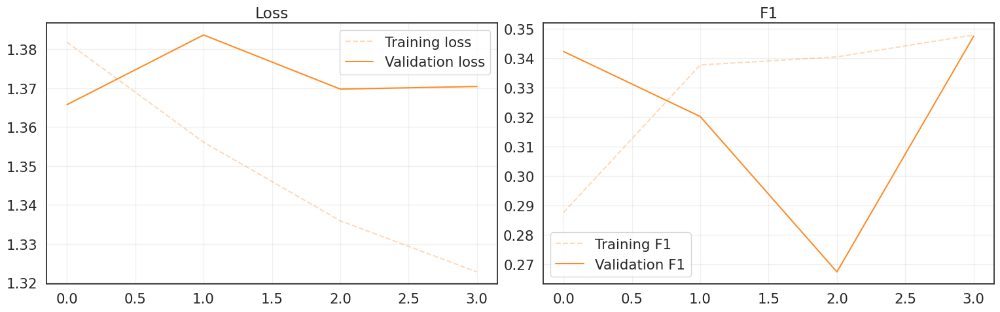

In [65]:
# @title Plot training history
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(tl_history['train_acc'], label='Training F1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(tl_history['val_acc'], label='Validation F1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

Evaluating Average Voting...
Average Voting F1 Score: 0.3198
Evaluating Majority Voting...
Majority Voting F1 Score: 0.3272
Evaluating Top-K Voting (K=3)...
Top-K (5) Voting F1 Score: 0.3852


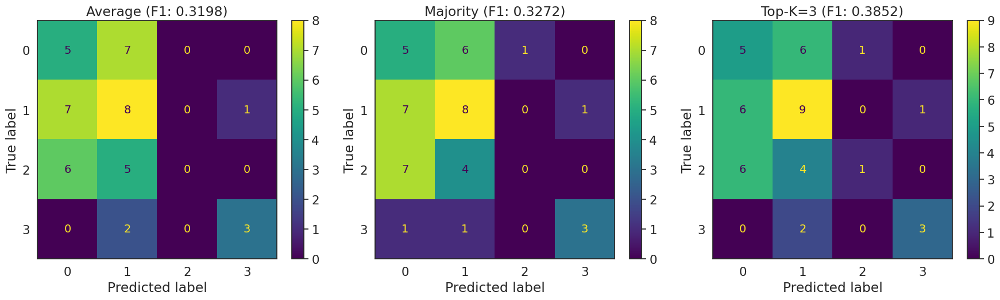

In [66]:
# @title Evaluation on testset (majority voting, average voting, top-k)

import torch
import numpy as np
from collections import defaultdict
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def evaluate_model(model, loader, device, voting_strategy="avg", tta=False):
    model.eval()
    all_probs = []
    all_targets = []
    all_image_ids = []

    with torch.no_grad():
        for inputs, targets, paths in loader:
            inputs, targets = inputs.to(device), targets.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                # --- TTA LOGIC START ---
                if tta:
                    # TTA returns already averaged probabilities
                    probs = predict_with_d4_tta(model, inputs)
                else:
                    # Standard inference
                    logits = model(inputs)
                    probs = torch.softmax(logits, dim=1)
                # --- TTA LOGIC END ---

            all_probs.append(probs.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

            # Extract image IDs from paths
            batch_image_ids = [p for p in paths]
            all_image_ids.extend(batch_image_ids)

    # Aggregate by image
    all_probs = np.concatenate(all_probs)
    all_targets = np.concatenate(all_targets)

    image_probs = defaultdict(list)
    image_true_labels = {}

    for i, image_id in enumerate(all_image_ids):
        image_probs[image_id].append(all_probs[i])
        image_true_labels[image_id] = all_targets[i]

    final_predictions = []
    final_targets = []

    for image_id in image_probs:
        probs = np.array(image_probs[image_id])

        # --- VOTING STRATEGIES ---
        if voting_strategy == "avg":
            avg_prob = np.mean(probs, axis=0)
            pred_class = np.argmax(avg_prob)

        elif voting_strategy == "majority":
            tile_preds = np.argmax(probs, axis=1)
            # Ensure we count up to num_classes
            counts = np.bincount(tile_preds, minlength=probs.shape[1])
            pred_class = np.argmax(counts)

        elif voting_strategy.startswith("top_k"):
            # Parse K from string (e.g., "top_k_5" -> 5)
            try:
                k = int(voting_strategy.split("_")[-1])
            except ValueError:
                raise ValueError("Top-K strategy must be in format 'top_k_<number>' (e.g., 'top_k_5')")

            # 1. Calculate confidence for each tile (max probability)
            confidences = np.max(probs, axis=1)

            # 2. Get indices of top K confident tiles
            # If we have fewer than k tiles, take all of them
            k_actual = min(k, len(probs))
            top_k_indices = np.argsort(confidences)[::-1][:k_actual]

            # 3. Filter probabilities and Average
            top_k_probs = probs[top_k_indices]
            avg_prob = np.mean(top_k_probs, axis=0)
            pred_class = np.argmax(avg_prob)

        else:
             raise ValueError(f"Unknown voting strategy: {voting_strategy}")

        final_predictions.append(pred_class)
        final_targets.append(image_true_labels[image_id])

    return np.array(final_targets), np.array(final_predictions)

# --- EXECUTION & PLOTTING ---

# 1. Evaluate Average Voting
print("Evaluating Average Voting...")
targets_avg, preds_avg = evaluate_model(tl_model, test_loader, device, voting_strategy="avg", tta=True)
f1_avg = f1_score(targets_avg, preds_avg, average="weighted")
print(f"Average Voting F1 Score: {f1_avg:.4f}")

# 2. Evaluate Majority Voting
print("Evaluating Majority Voting...")
targets_maj, preds_maj = evaluate_model(tl_model, test_loader, device, voting_strategy="majority", tta=True)
f1_maj = f1_score(targets_maj, preds_maj, average="weighted")
print(f"Majority Voting F1 Score: {f1_maj:.4f}")

# 3. Evaluate Top-K Voting (Example: Top 5 tiles)
print("Evaluating Top-K Voting (K=3)...")
targets_topk, preds_topk = evaluate_model(tl_model, test_loader, device, voting_strategy="top_k_3", tta=True)
f1_topk = f1_score(targets_topk, preds_topk, average="weighted")
print(f"Top-K (5) Voting F1 Score: {f1_topk:.4f}")

# Plot confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

cm_avg = confusion_matrix(targets_avg, preds_avg)
disp_avg = ConfusionMatrixDisplay(confusion_matrix=cm_avg)
disp_avg.plot(ax=axes[0])
axes[0].set_title(f"Average (F1: {f1_avg:.4f})")

cm_maj = confusion_matrix(targets_maj, preds_maj)
disp_maj = ConfusionMatrixDisplay(confusion_matrix=cm_maj)
disp_maj.plot(ax=axes[1])
axes[1].set_title(f"Majority (F1: {f1_maj:.4f})")

cm_topk = confusion_matrix(targets_topk, preds_topk)
disp_topk = ConfusionMatrixDisplay(confusion_matrix=cm_topk)
disp_topk.plot(ax=axes[2])
axes[2].set_title(f"Top-K=3 (F1: {f1_topk:.4f})")

plt.tight_layout()
plt.show()

## **Transfer Learning with PCA**

In [68]:
# @title Hyperparameters
num_classes = 4
HIDDEN_NEURONS = 0
DROPOUT_RATE = 0.35

HIDDEN_LAYERS = 3
HIDDEN_SIZE = 58
DROPOUT_FF = 0.20
L2_REGULARIZATION = 0.01
LR_FF = 0.001

EPOCHS_FF = 6000
PATIENCE = 200

tl_model = Resnet50TransferLearning(num_classes, DROPOUT_RATE, freeze_backbone=True, hidden_neurons=HIDDEN_NEURONS).to(device)


experiment_name = f"Resnet50_PCA_Tiles{PATCH_SIZE}_{HIDDEN_LAYERS}L_{HIDDEN_SIZE}H_{round(DROPOUT_FF, 2)}DO"

In [69]:
# @title FFNN Classifier

class FeedForwardNet(nn.Module):
  def __init__(self, in_features, hidden_layers, hidden_size, dropout_rate, num_classes):
    super().__init__()
    modules = []

    modules.append(nn.Linear(in_features, hidden_size))
    if dropout_rate > 0 :
      modules.append(nn.Dropout(dropout_rate))
    modules.append(nn.ReLU())

    for _ in range(hidden_layers):
      modules.append(nn.Linear(hidden_size, hidden_size))
      if dropout_rate > 0 :
          modules.append(nn.Dropout(dropout_rate))
      modules.append(nn.ReLU())

    modules.append(nn.Linear(hidden_size, num_classes))
    self.net = nn.Sequential(*modules)

  def forward(self, x):
    return self.net(x)

In [71]:
# @title Extract features

def extract_features(model, loader, device, num_epochs=1):
    model.eval()
    features_list = []
    labels_list = []
    paths_list = []

    print(f"Extracting features from {len(loader) * num_epochs} batches ({num_epochs} epochs)...")
    with torch.no_grad():
        for _ in range(num_epochs):
            for inputs, labels, paths in loader:
                inputs = inputs.to(device)
                with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                    features = model.get_features(inputs)
                features_list.append(features.cpu().numpy())
                labels_list.append(labels.numpy())
                paths_list.extend(paths)

    return np.concatenate(features_list), np.concatenate(labels_list), paths_list

print("Extracting features...")
# Use the previously trained tl_model
# Extract multiple epochs for training data to include augmentations
train_features, train_labels, train_paths = extract_features(tl_model, train_loader, device, num_epochs=5)
val_features, val_labels, val_paths = extract_features(tl_model, val_loader, device)
test_features, test_labels, test_paths = extract_features(tl_model, test_loader, device)

print(f"Train features shape: {train_features.shape}")

Extracting features...
Extracting features from 555 batches (5 epochs)...
Extracting features from 34 batches (1 epochs)...
Extracting features from 12 batches (1 epochs)...
Train features shape: (17750, 2048)


In [72]:
# @title Calculate PCA components

PCA_COMPONENTS = 0.95 # Keep 95% of variance
pca = PCA(n_components=PCA_COMPONENTS)

print("Fitting PCA...")
train_features_pca = pca.fit_transform(train_features)
val_features_pca = pca.transform(val_features)
test_features_pca = pca.transform(test_features)

print(f"PCA components: {pca.n_components_}")
print(f"Train features PCA shape: {train_features_pca.shape}")

Fitting PCA...
PCA components: 3
Train features PCA shape: (17750, 3)


In [73]:
# @title PCA Dataset and Loaders

class PCADataset(torch.utils.data.Dataset):
    def __init__(self, features, labels, paths):
        self.features = torch.tensor(features, dtype=torch.float32)
        self.labels = torch.tensor(labels)
        self.paths = paths

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx], self.paths[idx]

train_dataset_pca = PCADataset(train_features_pca, train_labels, train_paths)
val_dataset_pca = PCADataset(val_features_pca, val_labels, val_paths)
test_dataset_pca = PCADataset(test_features_pca, test_labels, test_paths)

train_loader_pca = DataLoader(train_dataset_pca, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
val_loader_pca = DataLoader(val_dataset_pca, batch_size=BATCH_SIZE, shuffle=False)
test_loader_pca = DataLoader(test_dataset_pca, batch_size=BATCH_SIZE, shuffle=False)

In [77]:
# @title Optimizer and scaler

INPUT_FEATURES = train_features_pca.shape[1]
writer = SummaryWriter("./"+logs_dir+"/"+experiment_name)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
ff_model = FeedForwardNet(INPUT_FEATURES, HIDDEN_LAYERS, HIDDEN_SIZE, DROPOUT_FF, num_classes).to(device)
optimizer_ff = torch.optim.AdamW(ff_model.parameters(), lr=LR_FF, weight_decay=L2_REGULARIZATION)
criterion = nn.CrossEntropyLoss()

In [79]:
# @title Training loop

ff_model, ff_history = fit(
    model=ff_model,
    train_loader=train_loader_pca,
    val_loader=val_loader_pca,
    epochs=EPOCHS_FF,
    criterion=criterion,
    optimizer=optimizer_ff,
    scaler=scaler,
    device=device,
    experiment_name=experiment_name,
    patience=PATIENCE,
    use_voting=False
)

Training 6000 epochs...
Epoch   1/6000 | Train: Loss=1.3449, F1=0.2173 | Val: Loss=1.3279, F1=0.1829 | Best: 0.1829 at epoch 1
Epoch   2/6000 | Train: Loss=1.3336, F1=0.1968 | Val: Loss=1.3226, F1=0.1829 | Best: 0.1829 at epoch 1
Epoch   3/6000 | Train: Loss=1.3312, F1=0.1901 | Val: Loss=1.3186, F1=0.1829 | Best: 0.1829 at epoch 1
Epoch   4/6000 | Train: Loss=1.3312, F1=0.1930 | Val: Loss=1.3206, F1=0.1857 | Best: 0.1857 at epoch 4
Epoch   5/6000 | Train: Loss=1.3309, F1=0.1883 | Val: Loss=1.3192, F1=0.1830 | Best: 0.1857 at epoch 4
Epoch   6/6000 | Train: Loss=1.3303, F1=0.1961 | Val: Loss=1.3196, F1=0.1832 | Best: 0.1857 at epoch 4
Epoch   7/6000 | Train: Loss=1.3304, F1=0.1903 | Val: Loss=1.3194, F1=0.1859 | Best: 0.1859 at epoch 7
Epoch   8/6000 | Train: Loss=1.3297, F1=0.1982 | Val: Loss=1.3183, F1=0.1829 | Best: 0.1859 at epoch 7
Epoch   9/6000 | Train: Loss=1.3302, F1=0.1935 | Val: Loss=1.3187, F1=0.1931 | Best: 0.1931 at epoch 9
Epoch  10/6000 | Train: Loss=1.3298, F1=0.1954 | 

## **Fine-tuning**

In [82]:
# @title Hyperparameters

LEARNING_RATE = 1e-3
EPOCHS = 1000
PATIENCE = 100

# Regularisation
DROPOUT_RATE = 0.35
L1_LAMBDA = 0
L2_LAMBDA = 1e-2
HIDDEN_UNITS = 64

# Loss function
count_labels = patch_train_df['label'].value_counts().sort_index()
weights = (count_labels.sum() / (len(LABEL_MAP) * count_labels)).values.astype(np.float32)
loss_weigths = torch.tensor(weights).to(device)
# CRITERION = FocalLoss(alpha=loss_weigths, gamma=2.0)
CRITERION = nn.CrossEntropyLoss(weight=loss_weigths)

EXPERIMENT_NAME = f'EffNet50FT_AutoAUG_patch_lr{LEARNING_RATE}_ep{EPOCHS}_pat{PATIENCE}_dr{DROPOUT_RATE}_las{L1_LAMBDA}_lr{L2_LAMBDA}_hu{HIDDEN_UNITS}_wce'

### **Architectures**

In [83]:
# @title ResNet50 fine-tuned

class ResNet50FineTuning(nn.Module):
    """ResNet50 with ImageNet pretrained weights and fine-tuning of last layers."""

    def __init__(self, num_classes, dropout_rate=0.3, unfreeze_layers=1, hidden_neurons=256):
        """
        Args:
            num_classes (int): Number of output classes.
            dropout_rate (float): Dropout probability in the new classifier.
            unfreeze_layers (int): Number of last ResNet layers to unfreeze (e.g., 1 for layer4, 2 for layer4 and layer3).
            hidden_neurons (int): Number of neurons in the hidden layer of the new classifier.
        """
        super().__init__()

        # 1. Load weights pretrained on ImageNet
        self.backbone = torchvision.models.resnet50(
            weights=torchvision.models.ResNet50_Weights.DEFAULT
        )

        # 2. Freeze all backbone layers first
        for param in self.backbone.parameters():
            param.requires_grad = False

        # 3. Unfreeze the last n layers
        # ResNet50 has 4 main layer blocks: layer1, layer2, layer3, layer4
        # We unfreeze from (4 - unfreeze_layers) to 3 (index of layer4)

        # List of the main layers in order of depth
        # Efficiently gets all layers that start with 'layer' and 'fc' is excluded.
        layers_to_unfreeze = [
            'layer4',
            'layer3',
            'layer2',
            'layer1',
            'backbone.avgpool', # Also include avgpool for completeness if needed, but usually not
            'backbone.conv1' # The first convolutional layer
        ]

        # The layers are in reverse order of depth for easy fine-tuning of the "last N"
        # We only care about layer1, layer2, layer3, layer4 for 'unfreeze_layers'
        main_layers = ['layer4', 'layer3', 'layer2', 'layer1']

        # Determine which layers to unfreeze
        # If unfreeze_layers is 1: only 'layer4'
        # If unfreeze_layers is 2: 'layer4' and 'layer3'
        layers_to_make_trainable = main_layers[:unfreeze_layers]

        print(f"Unfreezing ResNet50 layers: {layers_to_make_trainable}")

        for layer_name in layers_to_make_trainable:
            layer = getattr(self.backbone, layer_name)
            for param in layer.parameters():
                param.requires_grad = True

        # 4. Replace the Fully Connected (FC) layer (Always trainable)
        # ResNet uses 'fc'. The input features are the output of the last pooling layer.
        in_features = self.backbone.fc.in_features

        self.backbone.fc = nn.Sequential(
            nn.Linear(in_features, hidden_neurons),
            nn.ReLU(),
            nn.Dropout(p=dropout_rate),
            nn.Linear(hidden_neurons, num_classes)
        )

    def forward(self, x):
        """Passes input through the ResNet backbone."""
        return self.backbone(x)

In [84]:
# @title EfficientNet-B0 fine-tuned

class EfficientNetB0FineTuning(nn.Module):
    """EfficientNet-B0 with ImageNet pretrained weights and fine-tuning of last layers."""

    def __init__(self, num_classes, dropout_rate=0.3, unfreeze_blocks=3, hidden_neurons=256):
        super().__init__()

        # 1. Load weights pretrained on ImageNet
        self.backbone = torchvision.models.efficientnet_b0(
            weights=torchvision.models.EfficientNet_B0_Weights.DEFAULT
        )

        # 2. Freeze all backbone layers first
        for param in self.backbone.parameters():
            param.requires_grad = False

        # 3. Unfreeze the last n blocks
        # EfficientNet B0 features has 9 blocks (0-8)
        # We unfreeze from (9 - unfreeze_blocks) to 8
        total_blocks = len(self.backbone.features)
        start_block = total_blocks - unfreeze_blocks
        if start_block < 0: start_block = 0

        print(f"Unfreezing EfficientNet blocks from {start_block} to {total_blocks-1}")
        for i in range(start_block, total_blocks):
            for param in self.backbone.features[i].parameters():
                param.requires_grad = True

        # 4. Replace classifier (Always trainable)
        # Note: EfficientNet uses 'classifier' instead of 'fc'.
        # The default classifier is Sequential(Dropout, Linear), so we grab in_features from [1].
        in_features = self.backbone.classifier[1].in_features

        self.backbone.classifier = nn.Sequential(
            nn.Linear(in_features, hidden_neurons),
            nn.ReLU(),
            nn.Dropout(p=dropout_rate),
            nn.Linear(hidden_neurons, num_classes),
        )

    def forward(self, x):
        return self.backbone(x)

### **Training**

In [86]:
# @title Model summary

num_classes = 4
input_shape = (3, 256, 256)
tl_model = ResNet50FineTuning(num_classes, DROPOUT_RATE, unfreeze_layers=2, hidden_neurons=HIDDEN_UNITS).to(device)

# Display model summary
summary(tl_model, input_size=input_shape)
model_graph = draw_graph(tl_model, input_size=(BATCH_SIZE,)+input_shape, expand_nested=True, depth=6)
#model_graph.visual_graph

Unfreezing ResNet50 layers: ['layer4', 'layer3']
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]       

In [87]:
# @title Optimizer and scaler

# Setup training
writer = SummaryWriter("./"+logs_dir+"/"+EXPERIMENT_NAME)
OPTIMIZER = torch.optim.AdamW(tl_model.parameters(), lr=LEARNING_RATE)
scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
# Learning rate scheduler
SCHEDULER = torch.optim.lr_scheduler.ReduceLROnPlateau(OPTIMIZER, mode='max', factor=0.1, patience=5)

In [88]:
# @title Train loop

%%time

# Train with transfer learning
tl_model, tl_history = fit(
    model=tl_model,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    criterion=CRITERION,
    optimizer=OPTIMIZER,
    scaler=scaler,
    device=device,
    writer=writer,
    verbose=1,
    experiment_name=EXPERIMENT_NAME,
    patience=PATIENCE,
    scheduler=SCHEDULER,
    use_voting=True
)

final_val_acc = round(max(tl_history['val_acc']) * 100, 2)
print(f'Final validation F1: {final_val_acc}%')

Training 1000 epochs...
  (Current LR: 0.001000)
Epoch   1/1000 | Train: Loss=1.3812, F1=0.2399 | Val: Loss=1.3964, F1=0.1026 | Best: 0.1026 at epoch 1
  (Current LR: 0.001000)
Epoch   2/1000 | Train: Loss=1.3769, F1=0.2781 | Val: Loss=1.3633, F1=0.2039 | Best: 0.2039 at epoch 2
  (Current LR: 0.001000)
Epoch   3/1000 | Train: Loss=1.3538, F1=0.2393 | Val: Loss=1.4077, F1=0.1908 | Best: 0.2039 at epoch 2
  (Current LR: 0.001000)
Epoch   4/1000 | Train: Loss=1.3361, F1=0.2740 | Val: Loss=1.3758, F1=0.2563 | Best: 0.2563 at epoch 4
  (Current LR: 0.001000)
Epoch   5/1000 | Train: Loss=1.3262, F1=0.2657 | Val: Loss=1.3883, F1=0.2149 | Best: 0.2563 at epoch 4
  (Current LR: 0.001000)
Epoch   6/1000 | Train: Loss=1.3158, F1=0.2712 | Val: Loss=1.4589, F1=0.1654 | Best: 0.2563 at epoch 4
  (Current LR: 0.001000)
Epoch   7/1000 | Train: Loss=1.2938, F1=0.2829 | Val: Loss=1.6244, F1=0.2091 | Best: 0.2563 at epoch 4
  (Current LR: 0.001000)
Epoch   8/1000 | Train: Loss=1.2765, F1=0.3053 | Val: L

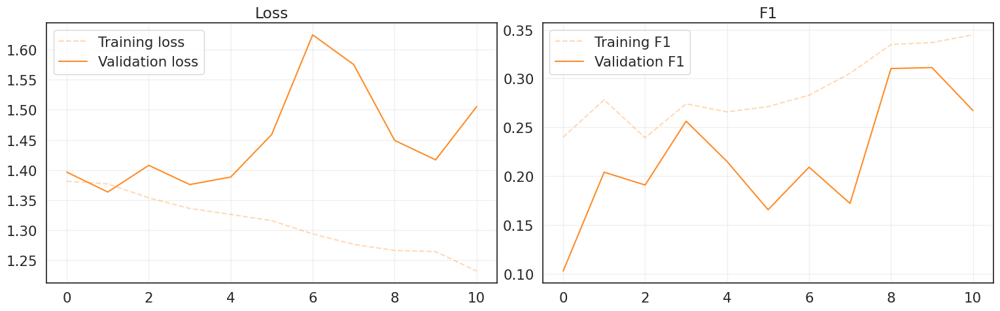

In [89]:
# @title Plot training history
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))

# Plot of training and validation loss on the first axis
ax1.plot(tl_history['train_loss'], label='Training loss', alpha=0.3, color='#ff7f0e', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Validation loss', alpha=0.9, color='#ff7f0e')
ax1.set_title('Loss')
ax1.legend()
ax1.grid(alpha=0.3)

# Plot of training and validation Accuracy on the second axis
ax2.plot(tl_history['train_acc'], label='Training F1', alpha=0.3, color='#ff7f0e', linestyle='--')
ax2.plot(tl_history['val_acc'], label='Validation F1', alpha=0.9, color='#ff7f0e')
ax2.set_title('F1')
ax2.legend()
ax2.grid(alpha=0.3)

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.show()

Evaluating Average Voting...
Average Voting F1 Score: 0.4729
Evaluating Majority Voting...
Majority Voting F1 Score: 0.4869
Evaluating Top-K Voting (K=3)...
Top-K (5) Voting F1 Score: 0.3948


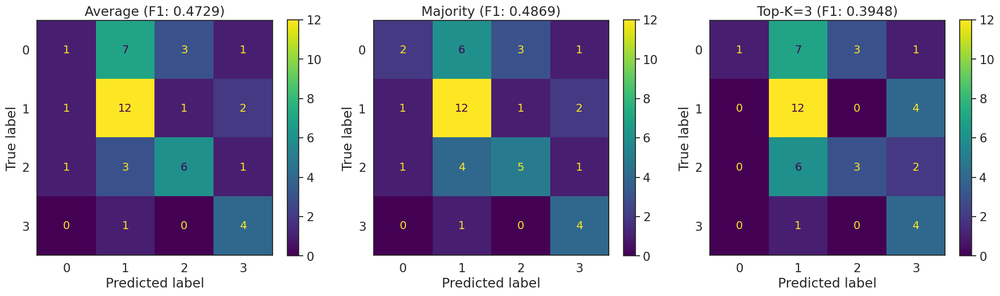

In [90]:
# @title Evaluation on testset (majority voting, average voting, top-k)

import torch
import numpy as np
from collections import defaultdict
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def evaluate_model(model, loader, device, voting_strategy="avg", tta=False):
    model.eval()
    all_probs = []
    all_targets = []
    all_image_ids = []

    with torch.no_grad():
        for inputs, targets, paths in loader:
            inputs, targets = inputs.to(device), targets.to(device)

            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                # --- TTA LOGIC START ---
                if tta:
                    # TTA returns already averaged probabilities
                    probs = predict_with_d4_tta(model, inputs)
                else:
                    # Standard inference
                    logits = model(inputs)
                    probs = torch.softmax(logits, dim=1)
                # --- TTA LOGIC END ---

            all_probs.append(probs.cpu().numpy())
            all_targets.append(targets.cpu().numpy())

            # Extract image IDs from paths
            batch_image_ids = [p for p in paths]
            all_image_ids.extend(batch_image_ids)

    # Aggregate by image
    all_probs = np.concatenate(all_probs)
    all_targets = np.concatenate(all_targets)

    image_probs = defaultdict(list)
    image_true_labels = {}

    for i, image_id in enumerate(all_image_ids):
        image_probs[image_id].append(all_probs[i])
        image_true_labels[image_id] = all_targets[i]

    final_predictions = []
    final_targets = []

    for image_id in image_probs:
        probs = np.array(image_probs[image_id])

        # --- VOTING STRATEGIES ---
        if voting_strategy == "avg":
            avg_prob = np.mean(probs, axis=0)
            pred_class = np.argmax(avg_prob)

        elif voting_strategy == "majority":
            tile_preds = np.argmax(probs, axis=1)
            # Ensure we count up to num_classes
            counts = np.bincount(tile_preds, minlength=probs.shape[1])
            pred_class = np.argmax(counts)

        elif voting_strategy.startswith("top_k"):
            # Parse K from string (e.g., "top_k_5" -> 5)
            try:
                k = int(voting_strategy.split("_")[-1])
            except ValueError:
                raise ValueError("Top-K strategy must be in format 'top_k_<number>' (e.g., 'top_k_5')")

            # 1. Calculate confidence for each tile (max probability)
            confidences = np.max(probs, axis=1)

            # 2. Get indices of top K confident tiles
            # If we have fewer than k tiles, take all of them
            k_actual = min(k, len(probs))
            top_k_indices = np.argsort(confidences)[::-1][:k_actual]

            # 3. Filter probabilities and Average
            top_k_probs = probs[top_k_indices]
            avg_prob = np.mean(top_k_probs, axis=0)
            pred_class = np.argmax(avg_prob)

        else:
             raise ValueError(f"Unknown voting strategy: {voting_strategy}")

        final_predictions.append(pred_class)
        final_targets.append(image_true_labels[image_id])

    return np.array(final_targets), np.array(final_predictions)

# --- EXECUTION & PLOTTING ---

# 1. Evaluate Average Voting
print("Evaluating Average Voting...")
targets_avg, preds_avg = evaluate_model(tl_model, test_loader, device, voting_strategy="avg", tta=True)
f1_avg = f1_score(targets_avg, preds_avg, average="weighted")
print(f"Average Voting F1 Score: {f1_avg:.4f}")

# 2. Evaluate Majority Voting
print("Evaluating Majority Voting...")
targets_maj, preds_maj = evaluate_model(tl_model, test_loader, device, voting_strategy="majority", tta=True)
f1_maj = f1_score(targets_maj, preds_maj, average="weighted")
print(f"Majority Voting F1 Score: {f1_maj:.4f}")

# 3. Evaluate Top-K Voting (Example: Top 5 tiles)
print("Evaluating Top-K Voting (K=3)...")
targets_topk, preds_topk = evaluate_model(tl_model, test_loader, device, voting_strategy="top_k_3", tta=True)
f1_topk = f1_score(targets_topk, preds_topk, average="weighted")
print(f"Top-K (5) Voting F1 Score: {f1_topk:.4f}")

# Plot confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

cm_avg = confusion_matrix(targets_avg, preds_avg)
disp_avg = ConfusionMatrixDisplay(confusion_matrix=cm_avg)
disp_avg.plot(ax=axes[0])
axes[0].set_title(f"Average (F1: {f1_avg:.4f})")

cm_maj = confusion_matrix(targets_maj, preds_maj)
disp_maj = ConfusionMatrixDisplay(confusion_matrix=cm_maj)
disp_maj.plot(ax=axes[1])
axes[1].set_title(f"Majority (F1: {f1_maj:.4f})")

cm_topk = confusion_matrix(targets_topk, preds_topk)
disp_topk = ConfusionMatrixDisplay(confusion_matrix=cm_topk)
disp_topk.plot(ax=axes[2])
axes[2].set_title(f"Top-K=3 (F1: {f1_topk:.4f})")

plt.tight_layout()
plt.show()

## **K-Fold Esemble**

In [91]:
# @title Hyperparameters
from sklearn.model_selection import StratifiedKFold

# K-Fold Hyperparameters
LEARNING_RATE = 1e-3
EPOCHS = 100
PATIENCE = 30

# Regularisation
DROPOUT_RATE = 0.35
L1_LAMBDA = 0
L2_LAMBDA = 4e-3
HIDDEN_UNITS = 64
HIDDEN_LAYERS = 1

count_labels = patch_train_df['label'].value_counts().sort_index()
weights = (count_labels.sum() / (len(LABEL_MAP) * count_labels)).values.astype(np.float32)
loss_weigths = torch.tensor(weights).to(device)
###CRITERION = FocalLoss(alpha=loss_weigths, gamma=2.0)
CRITERION = nn.CrossEntropyLoss(weight=loss_weigths, label_smoothing=0.1)

EXPERIMENT_NAME = f'Fold_ResNet50FT2_LS_TrivialAug_patch_lr{LEARNING_RATE}_ep{EPOCHS}_pat{PATIENCE}_dr{DROPOUT_RATE}_l1{L1_LAMBDA}_l2{L2_LAMBDA}_hu{HIDDEN_UNITS}_hl{HIDDEN_LAYERS}_wce'
N_FOLDS = 5


In [93]:
# @title Training loop
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
# Store models for ensemble
ensemble_models = []
fold_histories = []

# Ensure clean_train_labels is available
# We split based on images, not patches, to avoid data leakage
# clean_train_labels should be available from previous cells
X = clean_train_labels['sample_index'].values
y = clean_train_labels['label'].values

print(f"Starting {N_FOLDS}-Fold Cross-Validation...")

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"\n{'='*20} Fold {fold+1}/{N_FOLDS} {'='*20}")

    # 1. Split Data (Image level)
    fold_train_indices = X[train_idx]
    fold_val_indices = X[val_idx]

    # 2. Create Patch DataFrames
    # Filter patch_labels based on the image split
    fold_patch_train_df = patch_labels[patch_labels['sample_index'].isin(fold_train_indices)]
    fold_patch_val_df = patch_labels[patch_labels['sample_index'].isin(fold_val_indices)]

    print(f"Train patches: {len(fold_patch_train_df)}, Val patches: {len(fold_patch_val_df)}")

    # 3. Create Datasets and Loaders
    fold_train_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, fold_patch_train_df, transform=train_transform)
    fold_val_dataset = PatchDataset(NOBG_TRAIN_PATCH_DIR, fold_patch_val_df, transform=val_transform)

    fold_train_loader = make_loader(fold_train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=False)
    fold_val_loader = make_loader(fold_val_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

    # 4. Initialize Model
    # Re-instantiate the model for each fold to start from scratch (ImageNet weights)
    fold_model = ResNet50FineTuning(4, DROPOUT_RATE, unfreeze_layers=2, hidden_neurons=HIDDEN_UNITS).to(device)

    # 5. Setup Optimizer, Scaler, Scheduler
    fold_optimizer = torch.optim.AdamW(fold_model.parameters(), lr=LEARNING_RATE)
    fold_scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda'))
    fold_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(fold_optimizer, mode='max', factor=0.1, patience=5)

    # Tensorboard writer for this fold
    fold_experiment_name = f"{EXPERIMENT_NAME}_fold{fold+1}"
    fold_writer = SummaryWriter("./"+logs_dir+"/"+fold_experiment_name)

    # 6. Train
    fold_model, fold_history = fit(
        model=fold_model,
        train_loader=fold_train_loader,
        val_loader=fold_val_loader,
        epochs=EPOCHS,
        criterion=CRITERION,
        optimizer=fold_optimizer,
        scaler=fold_scaler,
        device=device,
        writer=fold_writer,
        verbose=1,
        experiment_name=fold_experiment_name,
        patience=PATIENCE,
        scheduler=fold_scheduler,
        use_voting=True
    )

    # Save fold model
    torch.save(fold_model.state_dict(), f"models/{fold_experiment_name}_model.pt")
    ensemble_models.append(fold_model)
    fold_histories.append(fold_history)

    print(f"Fold {fold+1} finished. Best Val F1: {max(fold_history['val_acc']):.4f}")

print("\nCross-Validation Complete!")

Starting 5-Fold Cross-Validation...

==================== Fold 1/5 ====================
Train patches: 3932, Val patches: 1061
Unfreezing ResNet50 layers: ['layer4', 'layer3']
Training 100 epochs...
  (Current LR: 0.001000)
Epoch   1/100 | Train: Loss=1.4026, F1=0.2567 | Val: Loss=1.4050, F1=0.2863 | Best: 0.2863 at epoch 1

Training manually stopped at epoch 2.
Best model restored from epoch 1 with val_acc 0.2863
Fold 1 finished. Best Val F1: 0.2863

==================== Fold 2/5 ====================
Train patches: 4049, Val patches: 944
Unfreezing ResNet50 layers: ['layer4', 'layer3']
Training 100 epochs...
  (Current LR: 0.001000)
Epoch   1/100 | Train: Loss=1.4065, F1=0.2536 | Val: Loss=1.5780, F1=0.1947 | Best: 0.1947 at epoch 1
  (Current LR: 0.001000)
Epoch   2/100 | Train: Loss=1.3921, F1=0.2884 | Val: Loss=2.3235, F1=0.0607 | Best: 0.1947 at epoch 1

Training manually stopped at epoch 3.
Best model restored from epoch 1 with val_acc 0.1947
Fold 2 finished. Best Val F1: 0.1947


In [ ]:
# @title Ensemble model
def get_avg_logits(models, inputs, device):
    """Averages logits from multiple models."""
    total_logits = None
    for model in models:
        model.eval()
        with torch.no_grad():
            logits = model(inputs.to(device))
            if total_logits is None:
                total_logits = logits.cpu()
            else:
                total_logits += logits.cpu()
    avg_logits = total_logits / len(models)
    return avg_logits

def max_vote_predictions(models, inputs, device):
    """Majority voting from multiple models."""
    all_preds = []
    for model in models:
        model.eval()
        with torch.no_grad():
            logits = model(inputs.to(device))
            preds = torch.argmax(logits, dim=1).cpu().numpy()
            all_preds.append(preds)
    all_preds = np.array(all_preds)
    final_preds = []
    for i in range(all_preds.shape[1]):
        # Count votes for each class
        counts = np.bincount(all_preds[:, i], minlength=len(LABEL_MAP))
        final_pred = np.argmax(counts)
        final_preds.append(final_pred)
    return np.array(final_preds)

class EnsembleModel(nn.Module):
    def __init__(self, models):
        super(EnsembleModel, self).__init__()
        self.models = models

    def forward(self, x):
        return get_avg_logits(self.models, x, device)


tl_model = EnsembleModel(ensemble_models).to(device)

# **GradCAM**

In [94]:
# @title Helper class and function

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Save activations during forward pass
        self.target_layer.register_forward_hook(self.save_activation)
        # Save gradients during backward pass
        self.target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        # Gradients of the loss with respect to the output of the layer
        self.gradients = grad_output[0]

    def __call__(self, x, class_idx=None):
        # Forward Pass
        self.model.eval()
        logits = self.model(x)

        if class_idx is None:
            # Default to the predicted class
            class_idx = logits.argmax(dim=1).item()

        # Zero grads and Backward Pass
        self.model.zero_grad()

        # Create a one-hot target to backpropagate from
        one_hot = torch.zeros_like(logits)
        one_hot[0, class_idx] = 1

        logits.backward(gradient=one_hot, retain_graph=True)

        # Compute Grad-CAM
        # Pool the gradients across the channels (Global Average Pooling)
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

        # Weight the channels by the gradients
        activations = self.activations.detach().clone()
        for i in range(activations.shape[1]):
            activations[:, i, :, :] *= pooled_gradients[i]

        # Average the channels to get a single heatmap
        heatmap = torch.mean(activations, dim=1).squeeze()

        # ReLU (we only care about positive influence)
        heatmap = torch.relu(heatmap)

        # Normalize heatmap to 0-1
        heatmap = heatmap.cpu().numpy()
        heatmap /= np.max(heatmap) if np.max(heatmap) > 0 else 1

        return heatmap, class_idx


def show_gradcam(img_tensor, heatmap, alpha=0.4):
    """
    Overlays the heatmap on the original image.
    img_tensor: [3, H, W] tensor (normalized)
    heatmap: [H, W] numpy array
    """
    # Denormalize image
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    img = std * img + mean
    img = np.clip(img, 0, 1)

    # Resize heatmap to image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert to color map
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB) / 255.0

    # Superimpose
    superimposed = heatmap_color * alpha + img * (1 - alpha)
    superimposed = np.clip(superimposed, 0, 1)

    # Plot
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Patch")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed)
    plt.title("Grad-CAM")
    plt.axis('off')
    plt.show()

Visualizing activation for Class Index: 3


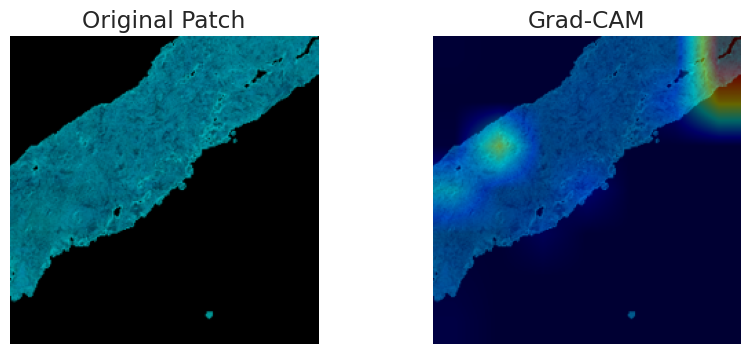

In [101]:
# Select specific layer
if "ResNet" in str(type(tl_model)):
    # Standard ResNet50
    target_layer = tl_model.backbone.layer4[-1]
else:
    # EfficientNet
    target_layer = tl_model.backbone.features[-1]

# Initialize GradCAM
grad_cam = GradCAM(tl_model, target_layer)

# Run on a single sample from val_loader
# Get a batch
data_iter = iter(val_loader)
for i in range(random.randrange(1,40)):
  images, labels, _ = next(data_iter)

# Select one image (e.g., the first one)
input_img = images[0].unsqueeze(0).to(device) # Add batch dim [1, 3, 224, 224]

# Generate Heatmap
heatmap, pred_class = grad_cam(input_img, class_idx=None)

print(f"Visualizing activation for Class Index: {pred_class}")
show_gradcam(images[0], heatmap)

In [96]:
if LOGIN_GDRIVE:
  !rsync -a $current_dir"/"$logs_dir/ "/content/"$logs_dir/
  %tensorboard --logdir "/content/"$logs_dir
else:
  %tensorboard --logdir "$logs_dir"

<IPython.core.display.Javascript object>

# **Predictions of Kaggle testset**

In [ ]:
# @title Parameters

USE_TTA = True

In [ ]:
# @title Helper function

class TestPatchDataset(torch.utils.data.Dataset):
    def __init__(self, img_dir, transform=None):
        self.transform = transform
        self.dir = img_dir
        self.preloaded_images = None
        self.data = [image for image in os.listdir(img_dir) if image.endswith('.png')]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Load Image
        filename = self.data[idx]
        if self.preloaded_images is not None:
            img = self.preloaded_images[idx]
        else:
            img = load_images(self.dir, [filename], load_mask=False)[0]

        # Apply trasformations
        if self.transform:
            img = self.transform(img)

        # Return image, label and parent image (from which it was patched)
        sample_id = filename.split('_')[:2]
        sample_id = '_'.join(sample_id) + ".png"
        return img, sample_id

    def preload_to_ram(self):
        self.preloaded_images = []
        for idx in range(len(self.data)):
            row = self.data.iloc[idx]
            filename = row['patch'] + '.png'
            img = load_images(self.dir, [filename], load_mask=False)[0]
            self.preloaded_images.append(img)


In [ ]:
# @title Generate Kaggle submission
VOTING_STRATEGY = 'avg'

submission_dataset = TestPatchDataset(NOBG_TEST_PATCH_DIR, transform=val_transform)
submission_loader = DataLoader(submission_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# Inference
tl_model.eval()
image_probs = defaultdict(list)

print(f"Generating predictions for {len(submission_dataset)} patches...")

with torch.no_grad():
    for inputs, slide_ids in submission_loader:
        inputs = inputs.to(device)
        with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
            logits = tl_model(inputs)
            probs = torch.softmax(logits, dim=1)

        probs_np = probs.cpu().numpy()
        for i, slide_id in enumerate(slide_ids):
            image_probs[slide_id].append(probs_np[i])

# Aggregate (average voting)

final_predictions = []
for image_id, probs_list in image_probs.items():
    if VOTING_STRATEGY == 'avg':
        avg_prob = np.mean(probs_list, axis=0)
        pred_class_idx = np.argmax(avg_prob)
        pred_label = INVERSE_LABEL_MAP[pred_class_idx]
    elif VOTING_STRATEGY.startswith("top"):
        k = int(VOTING_STRATEGY.split("_")[-1])
        # Compute confidence for each patch (max probability)
        probs_arr = np.array(probs_list)
        confidences = np.max(probs_arr, axis=1)

        # Get indices of top K confident patches
        # If we have fewer than k patches, slice takes all of them
        k_actual = min(k, len(probs_arr))
        top_k_indices = np.argsort(confidences)[::-1][:k_actual]

        # Filter probabilities and average
        top_k_probs = probs_arr[top_k_indices]
        avg_prob = np.mean(top_k_probs, axis=0)
        pred_class_idx = np.argmax(avg_prob)
    else:
        tile_preds = np.argmax(probs_list, axis=1)
        counts = np.bincount(tile_preds)
        pred_label = np.argmax(counts)

    final_predictions.append({'sample_index': image_id, 'label': pred_label})

# Save to CSV
submission_df = pd.DataFrame(final_predictions)
submission_df.to_csv(EXPERIMENT_NAME+".csv", index=False)
print('Submission file saved.')

In [ ]:
# @title Submit to Kaggle

submit_to_kaggle(EXPERIMENT_NAME)